# 02477 Bayesian Machine Learning - Exercise 2

In [1]:
%matplotlib inline
import pylab as plt
import pandas as pd
import jax.numpy as jnp
from jax import random
import seaborn as snb


from scipy.stats import binom as binom_dist

snb.set_style('darkgrid')
snb.set_theme(font_scale=1.)
colors = 'brgmc'
import sys
sys.path.insert(0, "../") 
from TOOL_BOX_OF_FUNCTIONS.LOGISTIC_REGRESSION_WEEK_2 import LOGISTIC_REG_WEEK_2 as LR

<!--
  Drop this entire block into a single **Markdown cell** in Jupyter.
  Each `<details>` section is collapsible (click the ► triangle).
  Math-Jax will typeset the LaTeX expressions automatically.
-->

# Bayesian Logistic Regression for O-Ring Failures  
*A tidy, collapsible reference sheet*

---

## Contents
1. **[The Big Picture](#big)**
2. **[Model Specification](#model)**
3. **[Bayesian Priors](#priors)**
4. **[Joint Distribution](#joint)**
5. **[Posterior Predictive Distribution](#postpred)**
6. **[Quick Recap](#recap)**  

---

<a id="big"></a>
<details>
<summary><strong>1. The Big Picture — Why are we doing this?</strong></summary>

Our goal is to quantify the uncertainty in the **number of failed o-rings at a new temperature** \(x^\*\).

$$
p(y^* \mid \mathbf{y},\,\mathbf{x},\,x^*)
$$

This is the **posterior predictive distribution**. Once we have it we can immediately answer:

| Question                  | Computation                                               |
|---------------------------|----------------------------------------------------------|
| Expected failures         | $\mathbb{E}[y^*]$                                        |
| Most likely failures      | $y^* = \underset{y^*}{\operatorname{arg\,max}}\; p(y^*\,|\,\ldots)$ |
| Probability of zero failures | $p(y^* = 0 \mid \ldots)$                              |
| 90% credible interval     | central interval containing 90% probability               |

</details>

---

<a id="model"></a>
<details>
<summary><strong>2. Model Specification — Likelihood, Link & Data-Generating Process</strong></summary>

### 2.1 Data  
* \(M\) launches (indexed by \(i\))  
* Each launch uses **\(N=6\)** o-rings  
* Observation: \((x_i,\,y_i)\) where  
  * \(x_i\) = temperature (°F)  
  * \(y_i \in \{0,\dots,6\}\) = failed o-rings  

### 2.2 Likelihood for a single launch  
$$
y_i \mid \theta_i \;\sim\; \operatorname{Binomial}(N=6,\;\theta_i),
$$

### 2.3 Logistic link (a GLM)  
$$
\boxed{\;\theta(x)\;=\;\sigma\!\bigl(\alpha+\beta x\bigr)},\qquad
\sigma(z)=\frac{1}{1+e^{-z}}
$$

with linear predictor \(f(x)=\alpha+\beta x\).

### 2.4 Full-data likelihood  
$$
p(\mathbf y \mid \mathbf x, \alpha,\beta)
=\prod_{i=1}^{M}\operatorname{Binomial}\!\bigl(y_i \mid 6,\theta_i\bigr).
$$

### 2.5 Predictive likelihood for a **new** launch at \(x^\*\)  
$$
p(y^\* \mid x^\*,\alpha,\beta)
=\operatorname{Binomial}\!\bigl(y^\* \mid 6,\theta^\*=\sigma(\alpha+\beta x^\*)\bigr).
$$

</details>

---

<a id="priors"></a>
<details>
<summary><strong>3. Bayesian Priors — What do we assume about \(\alpha, \beta\)?</strong></summary>

Because we lack strong prior knowledge, we choose **independent zero-mean Gaussians**:

$$
\alpha \sim \mathcal N\!\bigl(0,\sigma_\alpha^2\bigr),
\qquad
\beta  \sim \mathcal N\!\bigl(0,\sigma_\beta^2\bigr),
\qquad
\sigma_\alpha^2,\,\sigma_\beta^2>0.
$$

These weakly-informative priors merely keep the parameters from drifting to implausible magnitudes.

</details>

---

<a id="joint"></a>
<details>
<summary><strong>4. Joint Distribution — The entire probabilistic story</strong></summary>

$$
\boxed{
\begin{aligned}
p(\mathbf y, y^\*, \alpha, \beta \mid \mathbf x, x^\*)
&=
p(y^\* \mid x^\*,\alpha,\beta)\;
p(\mathbf y \mid \mathbf x,\alpha,\beta)\;
p(\alpha,\beta)
\\[6pt]
&=
\underbrace{\operatorname{Binomial}(y^\* \mid 6,\theta^\*)}_{\text{new launch}}
\times
\underbrace{\prod_{i=1}^M\operatorname{Binomial}(y_i \mid 6,\theta_i)}_{\text{historical launches}}
\times
\underbrace{\mathcal N(\alpha\mid0,\sigma_\alpha^2)\,
           \mathcal N(\beta\mid0,\sigma_\beta^2)}_{\text{priors}}.
\end{aligned}}
$$

Knowing the **joint** means we can derive any marginal or conditional distribution we like.

</details>

---

<a id="postpred"></a>
<details>
<summary><strong>5. Posterior Predictive Distribution — Integrating out uncertainty</strong></summary>

#### 5.1 Posterior over parameters  
$$
p(\alpha,\beta \mid \mathbf y,\mathbf x)
=\frac{p(\mathbf y \mid \mathbf x,\alpha,\beta)\,p(\alpha,\beta)}
       {p(\mathbf y \mid \mathbf x)}.
$$

#### 5.2 Averaging the predictive likelihood  
$$
\boxed{
p(y^\* \mid \mathbf y,\mathbf x, x^\*)
=
\iint
\underbrace{p(y^\* \mid x^\*,\alpha,\beta)}_{\text{Binomial predictive}}
\,\,
\underbrace{p(\alpha,\beta \mid \mathbf y,\mathbf x)}_{\text{posterior}}
\,d\alpha\,d\beta
}
$$

*Interpretation*  
> Draw many plausible \((\alpha,\beta)\) pairs from the posterior →  
> predict \(y^\*\) for each →  
> average the results.

Numerically, this is usually done with **MCMC** (e.g. NUTS/HMC).

</details>

---

<a id="recap"></a>
## 📝 Quick Recap
1. **Likelihood**: Binomial with a logistic link.  
2. **Priors**: Independent Gaussians on \(\alpha,\beta\).  
3. **Posterior**: Needs numerical inference.  
4. **Posterior predictive**: Integrate predictive likelihood over the posterior to answer real-world questions about future launches.  

---

**Next step** ➜ implement in Stan / PyMC / NumPyro, run MCMC, and visualise the posterior predictive distribution.


# Introduction

The purpose of this exercise is to dive deeper into the basic concepts of probabilistic and Bayesian modelling using **logistic regression** as a case-study. Specifically, we will study:

- the probability distributions involved in logistic regression
- how to approximate the posterior distribution of non-conjugate models using simple grid approximations
- how to make predictions using posterior predictive distributions

We will study these concepts using data from Challenger Space Shuttle disaster.


**Content**

- Part 1: Setting up the logistic regression model
- Part 2: The prior, likelihood and posterior
- Part 3: Making predictions using point estimates
- Part 4: Approximating the posterior using a grid approximation
- Part 5: Propagating uncertainty from parameters to predictions



# Dataset: The Challenger Space Shuttle disaster 

On a cold morning on January 28, 1986 the space shuttle called **Challenger** tragically exploded 73 seconds after its launch, killing all 7 crew members. The explosion was later determined to be caused the failure of two out of six so-called o-ring seals in one of the rocket boosters.
The temperature on the day of the launch was close $0^{\circ} C$, which was record-low. The cold weather made the o-rings stiffen, reducing their ability to seal the critical joints, and hence, causing the tragic accident. O-ring failure had previously been observed on 6 of out the 23 prior launches as plotted below.

In this exercise, you will construct a simple Bayesian logistic regression model for predicting the probability of o-ring failure as a function of temperature.

The dataset $\mathcal{D} = \left\lbrace (t_i, y_i) \right\rbrace_{i=1}^{M}$ consists of $M=23$ observations, where $y_i \in \left[0, 1, \dots 6\right]$ denotes the number of failed o-rings for the $i$'th temperature $t_i$. The number of o-rings for all launches were $N = 6$, and hence, the fraction of failed o-rings for the $i$'th launch is $\frac{y_i}{N} = \frac{y_i}{6}$.

See [Wikipedia](https://en.wikipedia.org/wiki/Space_Shuttle_Challenger_disaster) for more background information.


First, we will load the data:

In [2]:
# load data from csv file uisng pandas
data = pd.read_csv('./o-ring.csv')
t = data['temperature'].values
y = data['failed'].values
N = data['count'].values

data.head()

,temperature,failed,count
0,18.888889,0,6
1,21.111111,1,6
2,20.555556,0,6
3,20.000000,0,6
4,19.444444,0,6


.. and plot it:

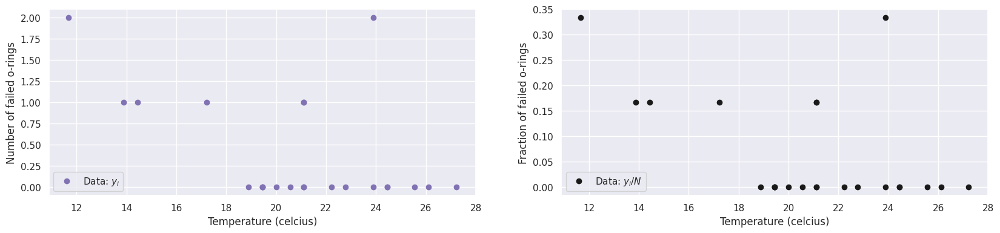

In [3]:
# helper function for plotting data
def plot_data(ax=None, counts=True):
    if counts:
        ax.plot(t, y, 'mo', label='Data: $y_i$')
        ax.set(ylabel='Number of failed o-rings')
    else:
        ax.plot(t, y/N, 'ko', label='Data: $y_i/N$')
        ax.set(ylabel='Fraction of failed o-rings')
    ax.set(xlabel='Temperature (celcius)')
    ax.legend(loc='lower left')

# plot
fig, ax = plt.subplots(1, 2, figsize=(20, 4))
plot_data(ax[0])
plot_data(ax[1], counts=False)

Rather than working directly with the temperatures $t_i \in \mathbb{R}$, we will standardize the temperatures to get

$$\begin{align*}
x_i = \frac{t_i - t_{\text{mean}}}{t_{\text{std}}},
\end{align*}$$
where $t_{\text{mean}}$ and $t_{\text{std}}$ are the empirical mean and standard deviation, respectively, of the observed temperatures $\left\lbrace t_i \right\rbrace_{i=1}^M$.

In [4]:
# compute mean and standard deviation of temperatures
tmean, tstd = jnp.mean(t), jnp.std(t)

# standardize temperatures
standardize = lambda t_: (t_ - tmean)/tstd
x = standardize(t)

# Part 1:  Setting up the logistic regression model

### The big picture

Our goal is to use the training data, i.e. the pairs of $\mathbf{x}_i$ and $y_i$, to learn a model such that we can make predictions and reason about the number of failures $y^*$ for a new input point $x^*$. In probabilistic terms, our goal is to compute $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$. That is, the distribution of the number of failures $y^*$ **conditioned on** the observed data $\mathbf{x}, \mathbf{y}$ as well as the new input point $x^*$. In probabilistic machine learning, we generally refer to $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$ as the **posterior predictive distribution**.
Once we computed this distribution, we can use it to reason about $y^*$ and answer questions like:
- What is the expected number of failures?
- What is the most likely number of failures?
- What is the probability that the number of failures is zero?
- What is a 90% interval credibility interval for the number of failures?

Before we can compute $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$, we first need to specify a model.

### Specifying the model

For each temperature $x_i$, we know the number of failed o-ring $y_i = \{0, 1, \dots, 6 \}$ out of the total number of o-rings $N_i = 6$. Hence, the number of failing o-rings $y_i$ for a given temperature $x_i$ can be described by a **Binomial distribution** with $N_i = 6$ and probability $\theta_i \in \left[0, 1\right]$: 

$$\begin{align}
y_i|\theta_i \sim \text{Bin}(N_i, \theta_i).
\end{align}
$$

> 🧠**Interpretation:**  this is equivalent to modeling the six rings as conditionally independent Bernoulli trials with common probability $\theta_i$ for a given $x_i$.

This is equivalent to modelling the failure of each individual o-ring as **conditionally independent** Bernoullli trials. Since all observations have $N_i = 6$, we drop the subscript $i$ and simply write $N = 6$ in the following to ease the notation.

Rather than imposing Beta-distributions as prior distributions for each $\theta_i$, we assume $\theta_i$ can be modelled as is a function of the temperature. Specifically, we assume

$\begin{align}
\theta(x) = \sigma(\alpha + \beta x),
\end{align}
$

where $\alpha, \beta \in \mathbb{R}$ are parameters to be estimated and $\sigma: \mathbb{R} \rightarrow \left[0, 1\right]$ is the **logistic sigmoid function**, i.e. $\sigma(x) = (1+\exp(-x))^{-1}$. For later references, we will denote the linear component of the model as $f(x)$, i.e.

$\begin{align}
f(x) = \alpha + \beta x.
\end{align}

Equivalently, the **log-odds** (logits) are linear in temperature: 

$$
\log\left(\frac{\theta(x)}{1-\theta(x)}\right) = f(x) = \alpha + \beta x.
$$


Note that both $\theta(x)$ and $f(x)$ do indeed depend on $\alpha$ and $\beta$, but we suppress this dependency to ease the notation. The likelihood for a single ($i$'th) data point thus becomes
$
\begin{align}
p(y_i|x_i, \alpha, \beta) = \text{Bin}(y_i|N_i, \theta_i), \quad \text{where} \quad \theta_i = \theta(x_i) = \sigma(\alpha + \beta x_i) = \frac{1}{1+\exp(-(\alpha + \beta x_i))}.
\end{align}
$
Assuming that all observations $\left\lbrace y_i \right\rbrace_{i=1}^M$ are **conditionally independent** given $\theta_i$, the likelihood of the full dataset becomes

$\begin{align}
p(\mathbf{y}|\mathbf{x}, \alpha, \beta) = \prod_{i=1}^M p(y_i|x_i, \alpha, \beta) = \prod_{i=1}^M  \text{Bin}(y_i|N, \theta_i),
\end{align}
$

where $\mathbf{y} = [y_1, y_2, \dots, y_M]$ and $\mathbf{x} = [x_1, x_2, \dots, x_M]$. Our goal is to be able to predict $y^*$ for a new temperature $x^*$.  To do this we write down the *predictive likelihood* for $y^*$, i.e.

$\begin{align}
p(y^*|x^*, \alpha, \beta) = \text{Bin}(y^*|N^*, \theta^*), \quad \text{where} \quad \theta^* = \theta(x^*) = \sigma(\alpha + \beta x^*) = \frac{1}{1+\exp(-(\alpha + \beta x^*))}.
\end{align}
$ 
Using the **product rule** and the assumption of conditional independence, we have

$\begin{align}
p(\mathbf{y}, y^*|\mathbf{x}, x^*, \alpha, \beta) = p(\mathbf{y}|\mathbf{x}, \alpha, \beta)p(y^*|x^*, \alpha, \beta) = \underbrace{\prod_{i=1}^M  \text{Bin}(y_i|N, \theta_i)}_{p(\mathbf{y}|\mathbf{x}, \alpha, \beta)} \underbrace{\text{Bin}(y^*|N^*, \theta^*)}_{p(y^*|x^*, \alpha, \beta)}.
\end{align}
$

To complete the Bayesian model, we need to impose a prior distribution on the parameters $\alpha, \beta$. Since we do not have any information about the parameters, we will impose generic Gaussian priors with zero mean:

$\begin{align}
p(\alpha, \beta) = \mathcal{N}(\alpha|0, \sigma^2_\alpha)\mathcal{N}(\beta|0, \sigma^2_{\beta})
\end{align}
$
for $\sigma^2_\alpha, \sigma^2_\beta > 0$. This leads to the following **joint distribution** for $y^*, \mathbf{y}, \alpha,$ and $\beta$:

$\begin{align}
p(\mathbf{y}, y^*, \alpha, \beta|\mathbf{x}, x^*) = p(y^*|x^*, \alpha, \beta)p(\mathbf{y}|\mathbf{x}, \alpha, \beta) p(\alpha, \beta) = \underbrace{\text{Bin}(y^*|N^*, \theta^*)}_{p(y^*|x^*, \alpha, \beta)}\underbrace{\prod_{i=1}^M  \text{Bin}(y_i|N, \theta_i)}_{p(\mathbf{y}|\mathbf{x}, \alpha, \beta)} \underbrace{\mathcal{N}(\alpha|0, \sigma^2_\alpha)\mathcal{N}(\beta|0, \sigma^2_{\beta})}_{p(\alpha, \beta)},
\end{align}
$

where we again used the product rule.

> 🧠**Why the joint matter**: Why the joint matters: it encodes all assumptions and dependencies. Any other quantity we care about is obtained by conditioning and/or marginalizing this joint.

The joint distribution is a central object because it completely determines how all variables (e.g. both data and parametes) interact and thus, it completely specifies our probabilistic model. From the joint distribution, we can derive any related distribution of interest using the rules of probability theory. 

### From the joint distribution to the posterior predictive distribution

Because we observe $\mathbf{y}$, we naturally consider the **conditional distribution** of $(y^*, \alpha, \beta)$ given the observed quantities $(\mathbf{y}, \mathbf{x}, x^*)$. Using the standard rules for conditional distributions, we get:

$\begin{align}
p(y^*, \alpha, \beta|\mathbf{y}, \mathbf{x}, x^*) = \frac{p(\mathbf{y}, y^*, \alpha, \beta|\mathbf{x}, x^*)}{p(\mathbf{y}|\mathbf{x})}.
\end{align}$

Our primary goal is to compute the **posterior predictive distribution** $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$, i.e. the **marginal distribution** of $y^*$ conditioned on the observed data, i.e. $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$ which can be obtained by marginalizing over $\alpha$ and $\beta$ via the **sum rule**:

$\begin{align}
p(y^*|\mathbf{y}, \mathbf{x}, x^*) = \int\int p(y^*, \alpha, \beta|\mathbf{y}, \mathbf{x}, x^*) \text{d} \alpha \text{d}\beta= \int\int \underbrace{p(y^*|x^*, \alpha, \beta)}_{\text{likelihood for }y^*} \underbrace{p(\alpha, \beta|\bm{y}, \bm{x})}_{\text{posterior distribution}} \text{d} \alpha \text{d}\beta,
\end{align}
$
as we derived in the lecture. The last equation shows that we can obtain the posterior predictive distribution by averaging the predictive likelihood wrt. to the posterior distribution. Hence, our first effort will be to get a handle on the posterior distribution of $\alpha$ and $\beta$ conditioned on $\mathbf{y}$.

For reference, the posterior over parameters is

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) 
\propto p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) \, p(\alpha, \beta)
= \left[ \prod_{i=1}^M \text{Bin}(y_i \mid N, \theta_i) \right] 
\mathcal{N}(\alpha \mid 0, \sigma_\alpha^2) \, \mathcal{N}(\beta \mid 0, \sigma_\beta^2),
$$

with proportionality constant $p(\mathbf{y} \mid \mathbf{x})^{-1}$.

*(In logistic regression, this posterior has no closed form, so we typically approximate it via Laplace approximation, variational inference, or MCMC. The predictive integral can then be evaluated by Monte Carlo averaging.)*

---

**Quick notation reminders (to reduce cognitive load while reading equations):**

- $N = N^* = 6$ throughout (six O-rings per case).
- $\theta_i = \sigma(\alpha + \beta x_i)$, and $\theta^* = \sigma(\alpha + \beta x^*)$.
- $f(x) = \alpha + \beta x$ is the linear predictor.
- $\theta(x) = \sigma(f(x))$.
- Bold symbols $\mathbf{x}, \mathbf{y}$ denote vectors over the $M$ observed cases.


____________________________

Before starting the practical implementation, we will practice the terminology and the probabilistic machinery.

**Task 1.1**: Use the **product rule** to write down the joint distribution of $\mathbf{y}, \alpha, $ and $\beta$ given $\mathbf{x}$:

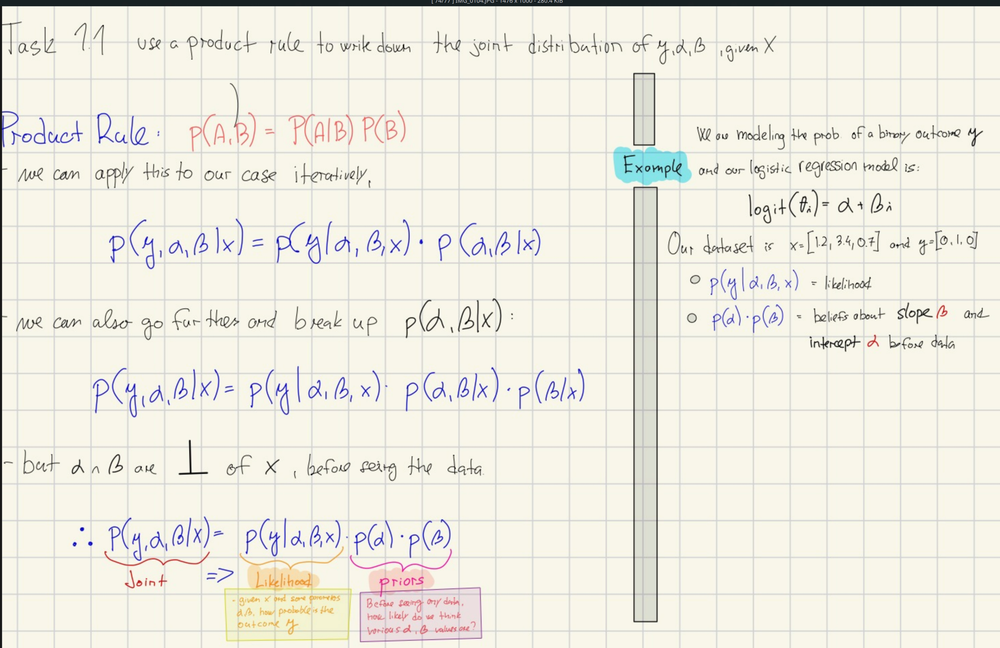



**Task 1.2**: Show that $p(\mathbf{y}, \alpha, \beta|\mathbf{x}) = \sum_{y^*}  p(\mathbf{y}, y^*, \alpha, \beta|\mathbf{x}, x^*)$, where the sum is over all possible outcomes of $y^*$.

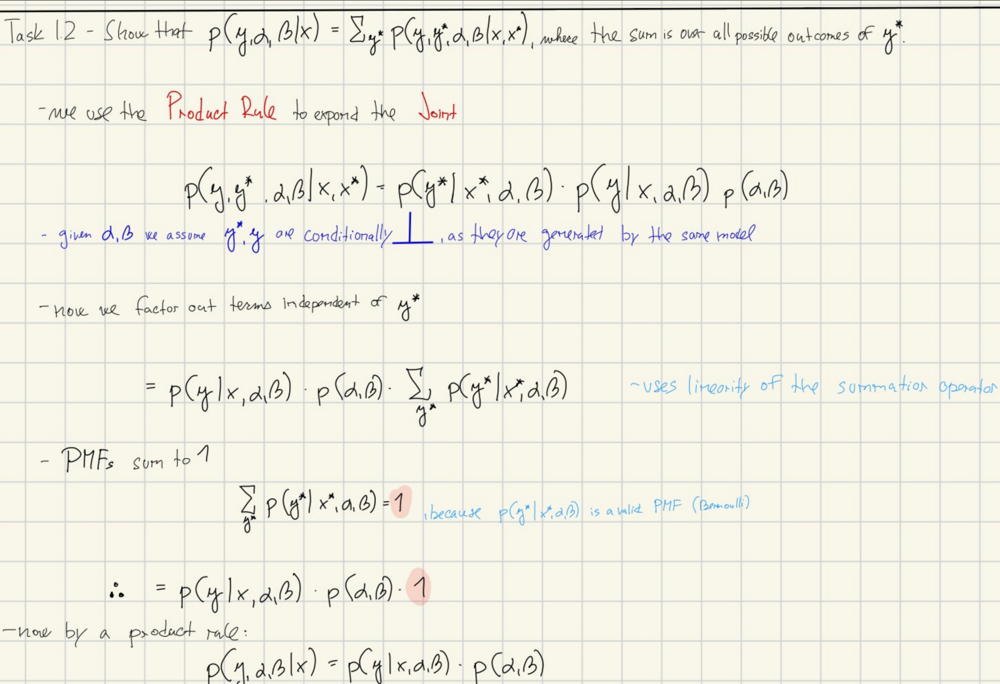

**Task 1.3**: Use Bayes' rule to express the posterior $p(\alpha, \beta|\mathbf{y}, \mathbf{x})$ in terms of the prior, likelihood and evidence and argue that the posterior is proportional to the joint distribution $p(\mathbf{y}, \alpha, \beta|\mathbf{x})$.

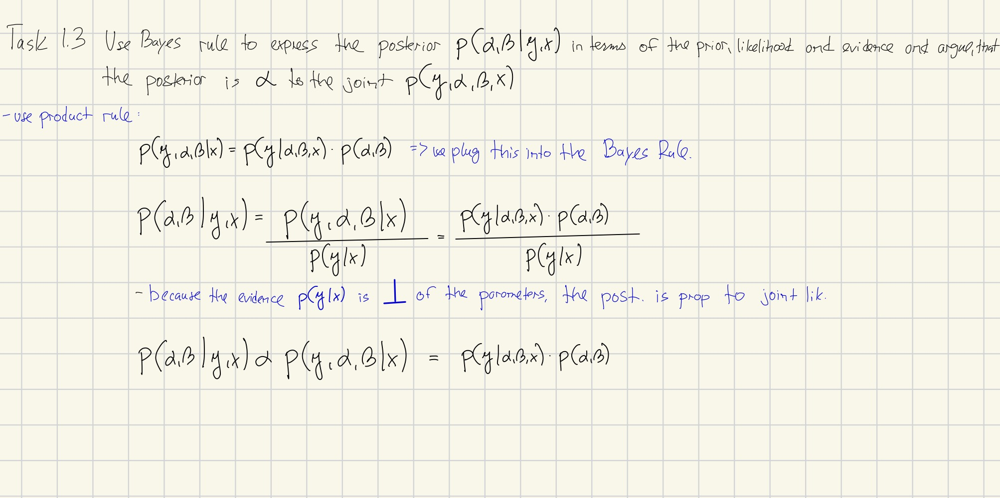


# Part 2:  The prior, likelihood and posterior

The goal of this part is to implement code for evaluating the prior, likelihood and posterior distribution. Due to a combination of **numerical precision** and **mathematical convenience**, we will implement functions for evaluating the logarithm of these distributions. 
Below you are given an incomplete implementation of the logistic regression model. Your task is to complete the implementation. The code contains a few sanity checks that will help to detect potential bugs and errors in your code.


**Task 2.1**: Complete the implementation of the functions *f, theta, log_prior* and *log_likelihood* below.

*Hints*:
- *For implementing the log prior, the function log_npdf is handy.*
- *When implementing the log likelihood, you can  either use *scipy.stats.binom* (imported as binom_dist) or you can implement the PMF of the binomial distribution from scratch.*
- *Note that for each function the output must have the same shape as the inputs. That is, if you run log_prior(1, 1), it should return a scalar. If you run log_prior(alpha_vec, beta_vec), where alpha_vec and beta_vec are [10 x 1] arrays, then the results should also be a [10 x 1] array*


In [5]:
import jax.numpy as jnp
from jax.scipy.stats import binom  # Note: you'll need this import for binom_dist.logpmf

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

# Sigmoid activation function: σ(x) = 1/(1 + exp(-x))
# Maps any real number to (0,1), used to convert linear outputs to probabilities
# Input shape: (...) -> Output shape: (...)
sigmoid = lambda x: 1./(1 + jnp.exp(-x))

# Log probability density function for normal distribution
# log N(x; μ, σ²) = -(x-μ)²/(2σ²) - 0.5*log(2πσ²)
# Input shapes: x(...), m(...), v(...) -> Output shape: (...)
log_npdf = lambda x, m, v: -(x-m)**2/(2*v) - 0.5*jnp.log(2*jnp.pi*v)


# ============================================================================
# BAYESIAN LOGISTIC REGRESSION MODEL
# ============================================================================

# ============================================================================
# USAGE EXAMPLE
# ============================================================================

# Example data setup:
# x = jnp.array([1.0, 2.0, 3.0, 4.0])      # predictor variables
# y = jnp.array([1, 3, 7, 9])               # observed successes  
# N = jnp.array([10, 10, 10, 10])           # trials per observation

# Instantiate model with default priors
# model = LogisticRegression(x, y, N)

# The model can now be used for:
# 1. MAP estimation: optimize model.log_joint(alpha, beta)
# 2. MCMC sampling: use log_joint as target density
# 3. Variational inference: approximate posterior over (α, β)
# 4. Prediction: model.theta(x_new, alpha_sample, beta_sample)
# instantiate model
model = LR.LogisticRegression(x, y, N)

# some sanity checks to help verify your implementation and make it compatible with the rest of the exercise
assert jnp.allclose(model.theta(x=2, alpha=2, beta=-0.5), 0.7310585786300049), "The value of output of the theta-function was different than expected. Please check your code."
assert jnp.allclose(model.log_prior(1., 1.), -2.8378770664093453), "The value of the output of the log_prior function was different than expected. Please check your code."
assert jnp.allclose(model.log_likelihood(-1.,2.), -95.18926297085957), "The value of the output of the log_likelihood function was different than expected. Please check your code."

assert model.theta(jnp.linspace(-3, 3, 10), 1, 1).shape == (10,), "The shape of the output of the theta-function was different than expected. Please check your code."
assert model.log_prior(jnp.linspace(-3, 3, 10), jnp.linspace(-3, 3, 10)).shape == (10,), "The shape of the output of the log_prior-function was different than expected. Please check your code."
assert model.log_likelihood(jnp.linspace(-3, 3, 10)[:, None], jnp.linspace(-3, 3, 10)[:, None]).shape == (10, 1),  "The shape of the output of the log_likelihood-function was different than expected. Please check your code."


__________
**📦 Use Case: Bayesian Logistic Regression with Binomial Data**

Let's suppose you're modeling the number of successes (e.g., passes in an exam) out of a fixed number of trials for different students based on their study time. You suspect that the probability of success increases with study time and want to model this probabilistically, incorporating uncertainty over the parameters.

In [9]:
# prepare the data 


x = jnp.array([1.0, 2.0, 3.0, 4.0])   # hours studied (input features)
y = jnp.array([1, 3, 7, 9])           # number of passes (successes)
N = jnp.array([10, 10, 10, 10])       # number of exams (trials)

# instanciate the model 
model_use_case = LR.LogisticRegression(x=x, y=y, N=N, sigma2_alpha=1.0, sigma2_beta=1.0)

**📐 Step 3: Compute Predictions with theta $\theta$**

➤ What does `theta()` do?
It computes the predicted probability of success for a given input using:
$$\theta(x) = \sigma(\alpha + \beta x),$$
where $\sigma(z) = \frac{1}{1 + e^{-z}}$

It can be used to **visualize the decision boundary** or **make predictions** with sampled parameters. 

In [10]:
# example: predict the success probability for x = 2, with alpha = 2, beta = -0,5 
prob_use_case = model_use_case.theta(2, alpha=2, beta=-0.5)
print(prob_use_case)  # ≈ 0.731 (sigmoid(2 - 1))

0.73105854


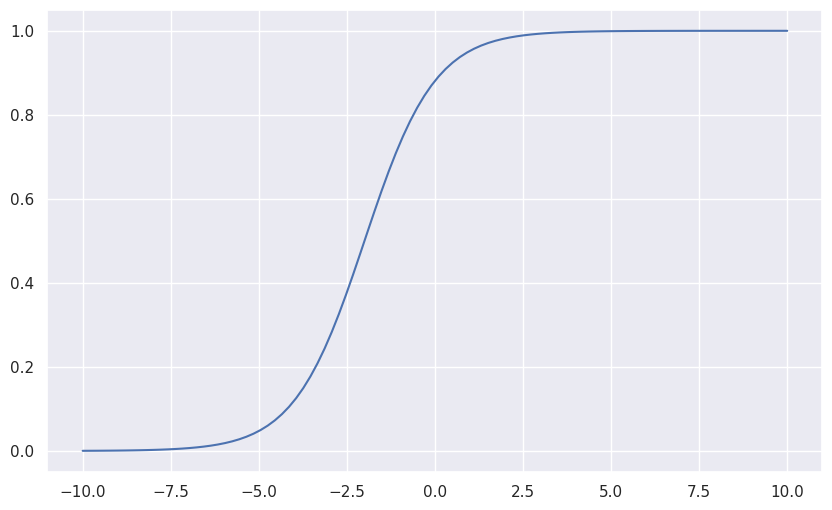

In [11]:
# You can also use this in batch mode:
x_grid_use_case = jnp.linspace(-10, 10, 100)
probs_use_case_2 = model.theta(x_grid_use_case, alpha=2.0, beta=1.0)

fig, ax = plt.subplots(1, figsize=(10, 6))
ax.plot(x_grid_use_case, probs_use_case_2)

**🔍 Step 4: Compute Log Prior with `log_prior`**
➤ What does `log_prior()` do?

It computes the log of the prior probability:
$$\log p(\alpha, \beta) = \log \mathcal{N}(\alpha, 0, \sigma^2_\alpha) + \log \mathcal{N}(\beta, 0, \sigma^2_\beta)$$

Use this when you want to penalize large parameter values, or to compute the posterior later via Bayes' rule.

In [12]:
# Example: log prior probability of α = 1, β = 1
logp = model.log_prior(1., 1.)
print(logp)  # ≈ -2.83


-2.837877


In [13]:
# You can also pass arrays to compute this for many values:
alphas = jnp.linspace(-3, 3, 10)
betas = jnp.linspace(-3, 3, 10)
log_priors = model.log_prior(alphas, betas)  # shape: (10,)
print(log_priors)
print(f"Shape of the log prior {log_priors.shape}")

[-10.837877   -7.282322   -4.615655   -2.8378768  -1.9489882  -1.9489882
  -2.837877   -4.6156554  -7.282322  -10.837877 ]
Shape of the log prior (10,)


**📈 Step 5: Compute Log Likelihood with `log_likelihood`**
➤ What does `log_likelihood()` do?

This computes the log probability of the observed data under the model, assuming:
$$y_i \mid \text{Binomial}(N_i, \theta_i) \quad \text{where} \quad \theta_i = \theta(x_i) = \sigma(\alpha + \beta x_i) = \frac{1}{1+\exp(-(\alpha + \beta x_i))}.$$

This is our likelihood function, which we will use to compute the posterior distribution.
$$
\log p(y \mid \alpha, \beta) = \sum_{i=1}^{N} \log \text{Binomial}(y_i \mid N_i, \theta_i) = \sum_{i=1}^{N} \left( \log \binom{N_i}{y_i} + y_i \log \theta_i + (N_i - y_i) \log (1 - \theta_i) \right)
$$


In [14]:
log_lik_use_case = model_use_case.log_likelihood(alpha=-1., beta=2.)
print(log_lik_use_case)

[-41.51465]


In [15]:
# FOr grid evaluation: 

alphas_use_case = jnp.linspace(-3, 3, 10)[:, None]
betas_use_case = jnp.linspace(-3, 3, 10)[:, None]
log_liks_use_case = model.log_likelihood(alphas_use_case, betas_use_case)  # shape: (10, 1)
print(log_liks_use_case)
print(f"Log likelihood use case shape = {log_liks_use_case.shape}")

[[ -53.163406]
 [ -45.3126  ]
 [ -41.038307]
 [ -44.073666]
 [ -62.532593]
 [-107.563705]
 [-179.16695 ]
 [-266.19385 ]
 [-360.53027 ]
 [-458.44345 ]]
Log likelihood use case shape = (10, 1)


**📊 Step 6: Compute Log Joint Probability with `log_joint`**
➤ What does `log_joint()` do?

It computes the unnormalized log posterior:
$$
\log p(\alpha, \beta \mid y) \propto \log p(y \mid \alpha, \beta) + \log p(\alpha, \beta)
$$  

In [16]:
log_joint = model.log_joint(alpha=1., beta=1.)
print(log_joint)  # A scalar value (e.g., -97.6)


-182.00482


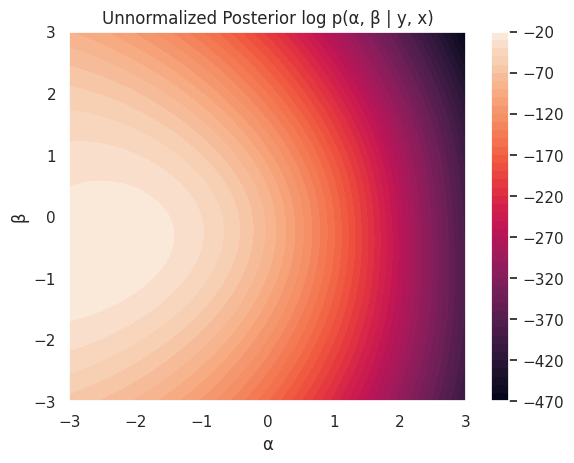

In [17]:
# this can be also computed over a grid for contour plots
import matplotlib.pyplot as plt
alpha_grid = jnp.linspace(-3, 3, 100)
beta_grid = jnp.linspace(-3, 3, 100)
AA, BB = jnp.meshgrid(alpha_grid, beta_grid)

log_post = jnp.vectorize(lambda a, b: model.log_joint(a, b))(AA, BB)

plt.contourf(AA, BB, log_post, levels=50)
plt.xlabel("α")
plt.ylabel("β")
plt.title("Unnormalized Posterior log p(α, β | y, x)")
plt.colorbar()
plt.show()


If the model implementation above is correct, then the code below should produce contour plots of the prior, likelihood and posterior. We also compute and plot the MLE and MAP estimators for the model. Because this is a 2D problem, we can simply obtain the MLE/MAP estimators by maximizing over the set of grid values. However, this becomes infeasible in higher dimensions, where gradient-based optimization is used instead.

In [17]:
class Grid2D(object):
    """
    Helper class for evaluating a function func on a 2D grid defined by (alpha, beta) parameters.
    
    Purpose: Enables visualization and analysis of probability distributions over parameter space
    for Bayesian inference in logistic regression.
    
    Mathematical Context:
    - For logistic regression: P(y|x) = sigmoid(alpha + beta*x)
    - We want to analyze: P(alpha, beta | data) ∝ P(data | alpha, beta) * P(alpha, beta)
    """

    def __init__(self, alphas, betas, func, name="Grid2D"):
        """
        Initialize the 2D grid and evaluate the function at all grid points.
        
        Args:
            alphas: 1D array of alpha values, shape (n_alpha,)
            betas: 1D array of beta values, shape (n_beta,) 
            func: Function to evaluate, takes (alpha, beta) and returns scalar or array
            name: String identifier for plotting
        """
        self.alphas = alphas                    # Shape: (n_alpha,)
        self.betas = betas                      # Shape: (n_beta,)
        self.grid_size = (len(self.alphas), len(self.betas))  # (n_alpha, n_beta) 
        # self.grid_size stores (J, K) so later we can map a 1-D index back to 2-D coordinates (needed for argmax)
        
        # Create 2D coordinate matrices for vectorized function evaluation
        # indexing='ij' means alpha varies along rows, beta along columns
        self.alpha_grid, self.beta_grid = jnp.meshgrid(alphas, betas, indexing='ij')
        # Shapes: alpha_grid (n_alpha, n_beta), beta_grid (n_alpha, n_beta)
        # Note: This produces two (J, K) arrays, A_jk = alphas[j] and B_jk = betas[k]
        
        self.func = func # Function to evaluate on the grid e.g. log_prior, log_likelihood, log_joint
        self.name = name # Identifier for the grid, used in plots, e.g. 'Prior', 'Likelihood', 'Posterior'
        
        # Evaluate function on each grid point
        # Add None dimension for broadcasting, then squeeze to remove singleton dims
        # Input shapes: (n_alpha, n_beta, 1) each
        # Output shape after squeeze: (n_alpha, n_beta)
        self.values = self.func(self.alpha_grid[:, :, None], self.beta_grid[:, :, None]).squeeze()
        # Note: Broadcasting trick: [:, :, None] adds a singleton 3ʳᵈ dimension so the model 
        # functions—written to accept shapes (batch, 1) or (1, batch)—work unchanged.
        # .squeeze() removes that dummy dimension → a plain (J,K)(J,K) table.

    def plot_contours(self, ax, color='b', num_contours=10, f=lambda x: x, alpha=1.0, title=None):
        """
        Plot contour lines of the evaluated function.
        
        Args:
            ax: Matplotlib axes object
            color: Color for contour lines
            num_contours: Number of contour levels
            f: Transform function (e.g., exp to convert log-space to probability space)
            alpha: Transparency level
            title: Optional plot title override
            
        Note: .T transpose is needed because matplotlib expects (y, x) indexing
        while our grid uses (alpha, beta) = (x, y) indexing
        """
        ax.contour(self.alphas, self.betas, f(self.values).T, num_contours, colors=color, alpha=alpha)
        ax.set(xlabel='$\\alpha$', ylabel='$\\beta$')
        ax.set_title(self.name, fontweight='bold')

    @property
    def argmax(self):
        """
        Find the (alpha, beta) coordinates of the maximum value.
        
        Returns:
            tuple: (alpha_max, beta_max) coordinates
            
        Mathematical meaning:
        - For log-likelihood: gives MLE (Maximum Likelihood Estimate)
        - For log-posterior: gives MAP (Maximum A Posteriori) estimate
        """
        idx = jnp.argmax(self.values)  # Flattened index of maximum
        # Convert flat index back to 2D coordinates
        alpha_idx, beta_idx = jnp.unravel_index(idx, self.grid_size)
        return self.alphas[alpha_idx], self.betas[beta_idx]


**🧠 What Grid2D Does**

In Bayesian logistic regression, we’re interested in understanding how the posterior distribution over parameters $\alpha$ and $\beta$ behaves.

The `Grid2D` class is a helper to evaluate and visualize any function of $(\alpha, \beta)$ on a 2D grid:

- ✅ Prior: $p(\alpha, \beta)$
- ✅ Likelihood: $p(y \mid \alpha, \beta)$
- ✅ Posterior: $p(\alpha, \beta \mid y) \propto p(y \mid \alpha, \beta) \cdot p(\alpha, \beta)$

**📦 What It Computes**
```python
self.values = self.func(self.alpha_grid[:, :, None], self.beta_grid[:, :, None]).squeeze()
``` 

Each element in `self.values[i, j]` stores the value of  
$f(\alpha_i, \beta_j)$

Where:

- $f$ is one of: `log_prior`, `log_likelihood`, or `log_joint` (posterior)
- $\texttt{self.alpha\_grid}[i, j] = \alpha_j$, $\texttt{self.beta\_grid}[i, j] = \beta_i$

**✅ Full Working Example with Explanations**

*🔧 Step 1: Prepare the model*

In [18]:
# Inputs
x_g = jnp.array([1.0, 2.0, 3.0, 4.0])  # Input features
y_g = jnp.array([1, 3, 7, 9])          # Observed successes
N_g = jnp.array([10, 10, 10, 10])      # Trials

# Instantiate your Bayesian logistic regression model
model_g = LR.LogisticRegression(x_g, y_g, N_g, sigma2_alpha=1.0, sigma2_beta=1.0)

*🌐 Step 2: Create the 2D parameter grid*

In [19]:
num_alpha_g, num_beta_g = 90, 100
alphas_g = jnp.linspace(-4, 4, num_alpha_g)  # α axis
betas_g  = jnp.linspace(-4, 4, num_beta_g)   # β axis

*📊 Step 3: Evaluate Prior, Likelihood, and Posterior*

In [20]:
# Prior: Encodes belief before seeing data
log_prior_grid = Grid2D(alphas=alphas_g, betas=betas_g, func=model.log_prior, name="Prior")

# Likelihood: How well parameters explain observed data
log_lik_grid = Grid2D(alphas=alphas_g, betas=betas_g, func=model.log_likelihood, name="Likelihood")

# Posterior: Combines data + prior blief 
log_joint_grid = Grid2D(alphas=alphas_g, betas=betas_g, func=model.log_joint, name="Posterior")

*🎯 Step 4: Extract MAP and MLE Estimates*

In [21]:
# Maximum Likelihood Estimate (ignores prior)
alpha_MLE_g, beta_MLE_g = log_lik_grid.argmax

# Maximum a Priori (include prior)
alpha_MAP_g, beta_MAP_g = log_joint_grid.argmax 

print(f"MLE: α = {alpha_MLE_g:.3f}, β = {beta_MLE_g:.3f}")
print(f"MAP: α = {alpha_MAP_g:.3f}, β = {beta_MAP_g:.3f}")


MLE: α = -2.921, β = -0.768
MAP: α = -2.562, β = -0.606


*🖼️ Step 5: Visualize the Grids*

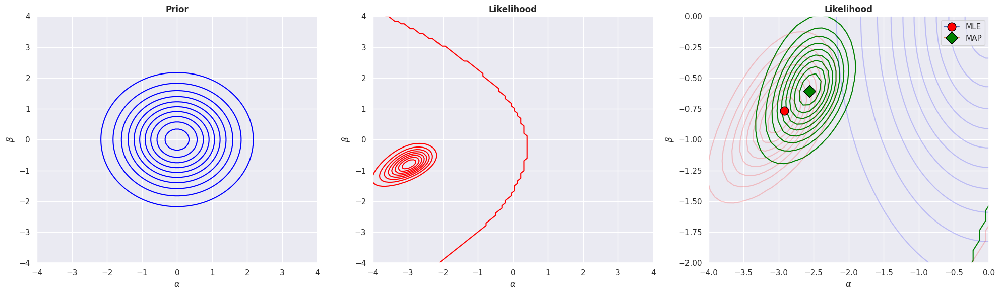

In [22]:
import matplotlib.pyplot as plt
import jax.numpy as jnp  # Assuming you're using JAX

# Colors for each component
colors_g = ['blue', 'red', 'green']

# Create figure and axes
fig_g, ax_g = plt.subplots(1, 3, figsize=(20, 6))

# Plot each component
for i, grid in enumerate([log_prior_grid, log_lik_grid, log_joint_grid]):
    grid.plot_contours(ax_g[i], f=jnp.exp, color=colors_g[i])

# Overlay prior and likelihood on posterior for intuition
log_prior_grid.plot_contours(ax_g[2], f=jnp.exp, color='blue', alpha=0.2)
log_lik_grid.plot_contours(ax_g[2], f=jnp.exp, color='red', alpha=0.2)

# Mark MLE and MAP
ax_g[2].plot(alpha_MLE_g, beta_MLE_g, marker='o', markersize=12, markerfacecolor='red', markeredgecolor='black', label='MLE')
ax_g[2].plot(alpha_MAP_g, beta_MAP_g, marker='D', markersize=12, markerfacecolor='green', markeredgecolor='black', label='MAP')

# Set limits and legend
ax_g[2].set_xlim(-4, 0)
ax_g[2].set_ylim(-2, 0)
ax_g[2].legend()

plt.tight_layout()
plt.show()


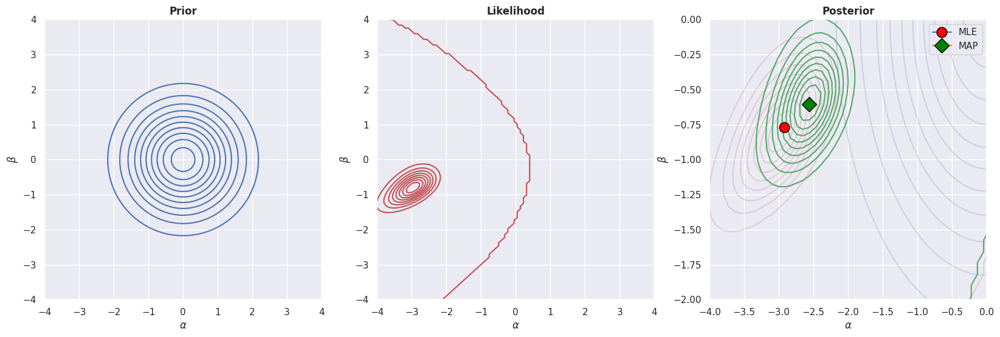

In [ ]:


# =============================================================================
# GRID SETUP AND FUNCTION EVALUATION
# =============================================================================

# Define grid points for parameter space exploration
# Different numbers of points for alpha and beta makes debugging easier
num_alpha, num_beta = 90, 100
alphas = jnp.linspace(-4, 4, num_alpha)  # Shape: (90,) - intercept parameter range
betas = jnp.linspace(-4, 4, num_beta)    # Shape: (100,) - slope parameter range

# Create Grid2D objects for each component of Bayesian analysis
# Assumes 'model' is a LogisticRegression object with methods:
# - log_prior(alpha, beta): log P(alpha, beta) 
# - log_likelihood(alpha, beta): log P(data | alpha, beta)
# - log_joint(alpha, beta): log P(alpha, beta | data) = log_prior + log_likelihood

model = LR.LogisticRegression(x, y, N, sigma2_alpha=1.0, sigma2_beta=1.0)

# Evaluate log prior distribution: log P(alpha, beta)
# Typically: log P(alpha) + log P(beta) where P(alpha) ~ N(0, sigma2_alpha), P(beta) ~ N(0, sigma2_beta)
log_prior_grid = Grid2D(alphas, betas, model.log_prior, 'Prior')

# Evaluate log likelihood: log P(data | alpha, beta) = Σ log P(yi | xi, alpha, beta)
# For logistic regression: Σ [yi*log(pi) + (1-yi)*log(1-pi)] where pi = sigmoid(alpha + beta*xi)
log_lik_grid = Grid2D(alphas, betas, model.log_likelihood, 'Likelihood')

# Evaluate log posterior (joint): log P(alpha, beta | data) ∝ log P(data | alpha, beta) + log P(alpha, beta)
log_joint_grid = Grid2D(alphas, betas, model.log_joint, 'Posterior')

# =============================================================================
# VISUALIZATION
# =============================================================================

# Create subplot layout: [Prior, Likelihood, Posterior]
fig, ax = plt.subplots(1, 3, figsize=(20, 6))

# Plot prior and likelihood contours on the posterior plot (rightmost) for comparison
# f=jnp.exp converts from log-space to probability space for better visualization
# alpha=0.2 makes these overlay contours semi-transparent
log_prior_grid.plot_contours(ax[2], f=jnp.exp, color='b', alpha=0.2)      # Blue, transparent
log_lik_grid.plot_contours(ax[2], f=jnp.exp, color='r', alpha=0.2)       # Red, transparent

# Plot each distribution on its own subplot
# colors[idx_plot] should be defined elsewhere (e.g., ['blue', 'red', 'green'])
for idx_plot, grid in enumerate([log_prior_grid, log_lik_grid, log_joint_grid]):
    grid.plot_contours(ax[idx_plot], f=jnp.exp, color=colors[idx_plot])

# =============================================================================
# POINT ESTIMATES
# =============================================================================

# Compute Maximum Likelihood Estimate (MLE): argmax P(data | alpha, beta)
# This finds the parameters that maximize the likelihood of observed data
alpha_MLE, beta_MLE = log_lik_grid.argmax

# Compute Maximum A Posteriori (MAP) estimate: argmax P(alpha, beta | data)
# This finds the parameters that maximize the posterior distribution
# MAP incorporates both data likelihood and prior beliefs
alpha_MAP, beta_MAP = log_joint_grid.argmax

# Plot point estimates on the posterior subplot
# Circle with filled color and edge
ax[2].plot(alpha_MLE, beta_MLE, marker='o', markersize=12,
           markerfacecolor='red', markeredgecolor='black', label='MLE')

ax[2].plot(alpha_MAP, beta_MAP, marker='D', markersize=12,
           markerfacecolor='green', markeredgecolor='black', label='MAP')
ax[2].set_xlim(-4, 0)
ax[2].set_ylim(-2, 0)
# add the plot label for prior 
ax[2].legend()

plt.show()
# Key Insights:
# - MLE ignores prior information, purely data-driven
# - MAP balances data likelihood with prior beliefs
# - If prior is uninformative, MLE ≈ MAP
# - If data is limited, MAP will be closer to prior mean than MLE

> **Task 2.2**: When plotting the contours of the posterior distribution, we actually evaluate the joint distribution and not the posterior distribution . Why is this okay when making contour plots?


Bayes' rule state that the posterior is proportional to the joint distribution. That is, $p(\alpha, \beta|\mathbf{y}, \mathbf{x}) = \frac{p(\mathbf{y}|\alpha, \beta, \mathbf{x})p(\alpha, \beta)}{p(\mathbf{y}|\mathbf{x})} \propto p(\mathbf{y}|\alpha, \beta, \mathbf{x})p(\alpha, \beta)$ because the evidence $p(\mathbf{y}|\mathbf{x})$ is constant wrt. $\alpha$ and $\beta$ and hence does not affect the contour plots.









> **Task 2.3**: Use the code above to experiment and investigate the relationship between the prior, likelihood and posterior. What happens if you change the prior variances of $\alpha, \beta$? E.g. $\sigma^2_{\alpha} = \sigma^2_{\beta} = 10$, $\sigma^2_{\alpha} = \sigma^2_{\beta} = 100$, $\sigma^2_{\alpha} = \sigma^2_{\beta} = 0.1$? What happens if $\sigma^2_\alpha = 1$ and $\sigma^2_{\beta} = 10$?

🧠 **Base Formulas Recap**

Let’s work in log-space since that’s what’s used in the code and grid:

🔷 **1. Log-likelihood** (unchanged — depends only on data):

$$
\log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) = \sum_{i=1}^N \left[ y_i \log \sigma(\alpha + \beta x_i) + (1 - y_i) \log(1 - \sigma(\alpha + \beta x_i)) \right]
$$

🔶 **2. Log-prior** (this changes with $\sigma_\alpha^2$ and $\sigma_\beta^2$):

Assume: $\alpha \sim \mathcal{N}(0, \sigma_\alpha^2), \quad \beta \sim \mathcal{N}(0, \sigma_\beta^2)$

Then:

$$
\log p(\alpha, \beta) = -\frac{1}{2} \left( \frac{\alpha^2}{\sigma_\alpha^2} + \frac{\beta^2}{\sigma_\beta^2} \right) + \text{const}
$$

So **changing** $\sigma^2_\alpha$ or $\sigma^2_\beta$ changes the penalty term:

- If $\sigma^2$ is **small**, the penalty is **large**, which *pulls* $\alpha$ or $\beta$ **closer to zero**.
- If $\sigma^2$ is **large**, the penalty is **small**, so the prior becomes **flatter**.

🟢 **3. Log-posterior (this is the key):**

$$
\log p(\alpha, \beta \mid \mathbf{x}, \mathbf{y}) = \log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) + \log p(\alpha, \beta) + \text{const}
$$

If we substitute in the equations:

$$
\log p(\alpha, \beta \mid \mathbf{x}, \mathbf{y}) = \sum_{i=1}^{N} \left[ y_i \log \sigma(\alpha + \beta x_i) + (1 - y_i) \log(1 - \sigma(\alpha + \beta x_i)) \right] - \frac{1}{2} \left( \frac{\alpha^2}{\sigma_\alpha^2} + \frac{\beta^2}{\sigma_\beta^2} \right) + \text{const}
$$

This is the **exact formula** used in your code’s `log_joint`.

🧪 Effect of Changing Prior Variances

Let’s now see how the equation changes for each case:

✅ **Case 1: $\sigma^2_\alpha = \sigma^2_\beta = 100$**

$$
\log p(\alpha, \beta) = -\frac{1}{2} \left( \frac{\alpha^2}{100} + \frac{\beta^2}{100} \right)
$$

👉 The penalty term becomes:

$$
-\frac{1}{200} (\alpha^2 + \beta^2)
$$

🟢 This is a **very small penalty**, so the prior is almost flat  
🟢 The log-posterior $\approx$ log-likelihood  
🟢 MAP $\approx$ MLE

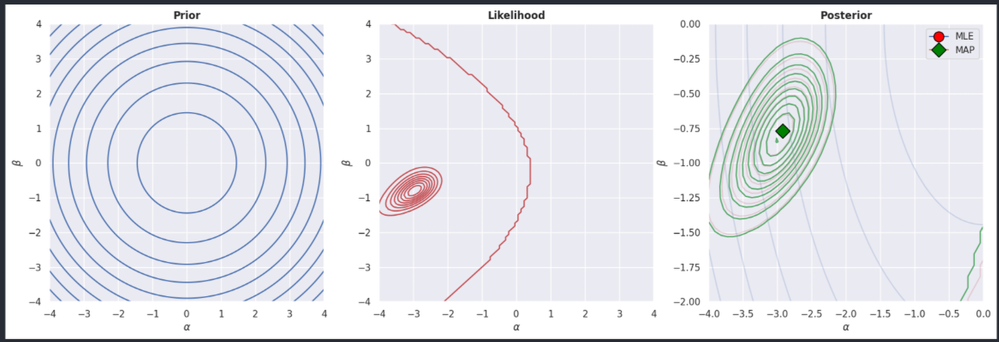

______

✅ **Case 2: $\sigma^2_\alpha = \sigma^2_\beta = 0.1$**

$$
\log p(\alpha, \beta) = -\frac{1}{2} \left( \frac{\alpha^2}{0.1} + \frac{\beta^2}{0.1} \right) = -5(\alpha^2 + \beta^2)
$$

🔴 This is a **strong penalty**, heavily pulling $(\alpha, \beta)$ toward 0  
🔴 The posterior is **dominated by the prior**  
🔴 MAP is **far from MLE**, closer to prior mean (which is 0)

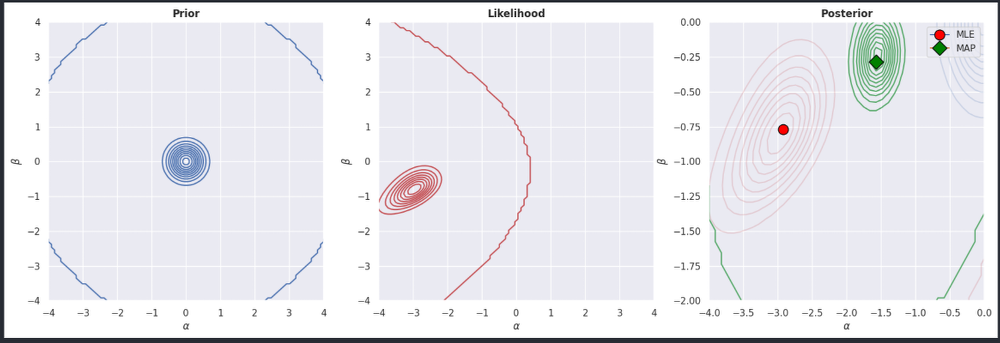

_____

✅ **Case 3: $\sigma^2_\alpha = 1$, $\sigma^2_\beta = 10$**

$$
\log p(\alpha, \beta) = -\frac{1}{2} \left( \alpha^2 + \frac{\beta^2}{10} \right)
$$

🟡 The prior penalizes $\alpha$ more than $\beta$  
🟡 So the MAP estimate is more conservative (closer to 0) in $\alpha$  
🟡 The posterior is more squeezed along the $\alpha$-axis



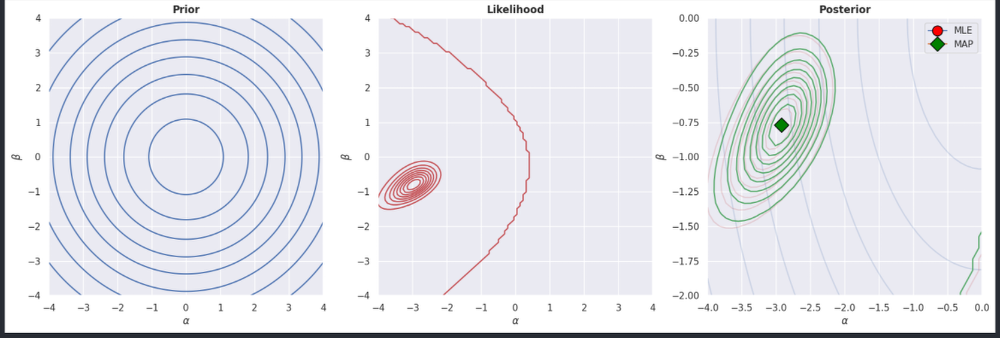


📌 Summary Table of Log-Prior Term:
| $\sigma^2\_\alpha$ | $\sigma^2\_\beta$ | Penalty term in log-prior                       | Interpretation               |
| -------------------- | ------------------- | ----------------------------------------------- | ---------------------------- |
| 100                  | 100                 | $-\frac{1}{200}(\alpha^2 + \beta^2)$          | Almost flat prior            |
| 0.1                  | 0.1                 | $-5(\alpha^2 + \beta^2)$                      | Strong prior pulling to 0    |
| 1                    | 10                  | $-\frac{1}{2}(\alpha^2 + \frac{\beta^2}{10})$ | Prior stronger on $\alpha$ |
__________________________-

**Task 2.4**: What happens to the MLE and MAP estimators when you change the variances of the prior?

✅ **Task 2.4 Answer**

🧠 **What happens to the MLE and MAP estimators when you change the prior variances?**

---

🔴 **MLE is unchanged by the prior variance.**

- **Definition:**

$$
(\alpha_{\text{MLE}}, \beta_{\text{MLE}}) = \arg \max_{\alpha, \beta} \log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta)
$$

- Only depends on the data via the likelihood.  
- So no matter what prior you choose, MLE will stay the same.

---

🟢 **MAP is affected by the prior variance.**

- **Definition:**

$$
(\alpha_{\text{MAP}}, \beta_{\text{MAP}}) = \arg \max_{\alpha, \beta} \left[ \log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) + \log p(\alpha, \beta) \right]
$$

- The second term,

$$
\log p(\alpha, \beta) = -\frac{1}{2} \left( \frac{\alpha^2}{\sigma^2_\alpha} + \frac{\beta^2}{\sigma^2_\beta} \right) + \text{const}
$$

acts as a **regularizer** that discourages large values of $\alpha$ and $\beta$.

---

📋 **Summary of Effects**

| **Prior variance** | **Effect on log prior**               | **Effect on MAP estimate**              | **MLE**      |
|--------------------|---------------------------------------|-----------------------------------------|--------------|
| $\sigma^2 \to \infty$        | Prior becomes flat (uninformative) | MAP $\approx$ MLE                        | Unchanged    |
| $\sigma^2$ small    | Prior becomes sharp around 0         | MAP is pulled toward 0                 | Unchanged    |
| Asymmetric (e.g. $\sigma^2_\alpha = 1$, $\sigma^2_\beta = 10$) | Penalizes $\alpha$ more than $\beta$ | MAP is closer to 0 in $\alpha$ | Unchanged    |


🧮 **Connection to the Equation (again, explicitly)**

**Posterior log-probability:**

$$
\log p(\alpha, \beta \mid \mathbf{x}, \mathbf{y}) = 
\underbrace{\log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta)}_{\text{Likelihood (data)}} + 
\underbrace{\log p(\alpha, \beta)}_{\text{Prior (regularizer)}}
$$

---

**Substituting the Gaussian prior:**

$$
\log p(\alpha, \beta \mid \mathbf{x}, \mathbf{y}) =
\sum_{i=1}^{N} \left[ y_i \log \sigma(\alpha + \beta x_i) + (1 - y_i) \log(1 - \sigma(\alpha + \beta x_i)) \right] 
- \frac{1}{2} \left( \frac{\alpha^2}{\sigma_\alpha^2} + \frac{\beta^2}{\sigma_\beta^2} \right) + \text{const}
$$

---

- The **MLE ignores the prior**, so it just maximizes the first sum.  
- The **MAP includes the prior penalty**, so:
  - Small variances **increase** the penalty → MAP is more regularized.  
  - Large variances **reduce** the penalty → MAP moves **closer to MLE**.

---

🟩 **Intuition**

- MAP is a **regularized** version of MLE.  
- The **prior variance controls the strength of regularization**:
  - Smaller $\sigma^2$ = stronger regularization = more trust in prior.  
  - Larger $\sigma^2$ = weaker regularization = more trust in data.



**Task 2.5**: What happens to the prior, likelihood and posterior if you only use a subset of the data? Use the code above to experiment and investigate what happens, e.g. use the first 10 data instead of the full $M = 23$ datapoints.

🔵 **1. The Prior:**

**Unchanged.**  
It is **independent of the data**, defined as:

$$
p(\alpha, \beta) = \mathcal{N}(0, \sigma^2_\alpha) \cdot \mathcal{N}(0, \sigma^2_\beta)
$$

So in code:

```python
model = LR.LogisticRegression(x_subset, y_subset, N, sigma2_alpha, sigma2_beta)
log_prior_grid = Grid2D(alphas, betas, model.log_prior, "Prior")
```

➡️ The prior will be the **same regardless** of how many data points you use.

---

🔴 **2. The Likelihood:**

Log-likelihood is:

$$
\log p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) = \sum_{i=1}^{N} \left[ y_i \log \sigma(\alpha + \beta x_i) + (1 - y_i) \log(1 - \sigma(\alpha + \beta x_i)) \right]
$$

✂️ **Using fewer datapoints** (e.g. first 10 instead of 23):

- This **reduces the sum**, so the likelihood becomes:
  - **Less peaked** (less confident)
  - **Flatter**, more spread out
- You're working with less evidence, so the model is more **uncertain** about which parameters are optimal.

---

🟢 **3. The Posterior:**

Posterior (in log-space) is:

$$
\log p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) = \log \text{Likelihood} + \log \text{Prior}
$$

- Since the **likelihood is flatter**, the **prior becomes more influential** in the posterior.
- So the **posterior shifts closer to the prior**.

That means:
- The **MAP estimate moves toward (0, 0)**.
- The **posterior is broader**, less peaked.


📌 Summary Table

| Component  | Mathematical Change    | Code Effect                         | Intuition                                       |
| ---------- | ---------------------- | ----------------------------------- | ----------------------------------------------- |
| Prior      | None (fixed)           | Unchanged                           | Still centered at 0                             |
| Likelihood | Shorter sum over data  | Flatter, less informative           | More uncertainty about best \$(\alpha, \beta)\$ |
| Posterior  | Prior becomes dominant | Posterior peak shifts toward (0, 0) | MAP ≠ MLE becomes more pronounced               |


**🧠 Conceptual Takeaway**

    With less data, the likelihood becomes weaker, and the prior plays a stronger role in shaping the posterior.
    That’s the whole idea behind Bayesian reasoning: when data is scarce, trust your prior more.

**Task 2.6**: Use the plots to roughly estimate the prior and posterior probability of the event $\beta < 0 $.





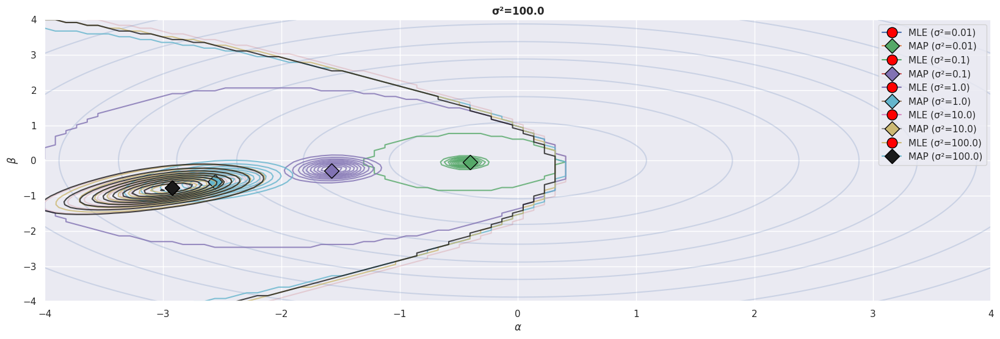

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(20, 6))

# plot the likelihood contours
log_lik_grid.plot_contours(ax, f=jnp.exp, color='r', alpha=0.2)
# Plot prior contours
log_prior_grid.plot_contours(ax, f=jnp.exp, color='b', alpha=0.2)

color_list = ['g', 'm', 'c', 'y', 'k']
for idx, s in enumerate([0.01, 0.1, 1.0, 10.0, 100.0]):
    model = LR.LogisticRegression(x, y, N, sigma2_alpha=s, sigma2_beta=s)
    log_joint = Grid2D(alphas, betas, model.log_joint, f'σ²={s}')
    # Plot on the posterior subplot (ax)
    log_joint.plot_contours(ax, f=jnp.exp, color=color_list[idx], alpha=0.8, title=f'σ²={s}')

    # Plot point estimates for each σ²
    # MLE is always the same (from likelihood only)
    alpha_MLE, beta_MLE = log_lik_grid.argmax
    # MAP depends on the prior
    alpha_MAP, beta_MAP = log_joint.argmax      

    # Plot MLE and MAP estimates with different colors and labels
    ax.plot(alpha_MLE, beta_MLE, marker='o', markersize=12,
            markerfacecolor='red', markeredgecolor='black', 
            label=f'MLE (σ²={s})')
    ax.plot(alpha_MAP, beta_MAP, marker='D', markersize=12,
            markerfacecolor=color_list[idx], markeredgecolor='black', 
            label=f'MAP (σ²={s})')
ax.legend()
plt.show()

# Part 3:  Making predictions using point estimates

Our model for the probability of failure for each individual o-ring is given by

$$\begin{align*}
\theta(x) = \sigma(\alpha + \beta x),
\end{align*}
$$

where $\alpha, \beta \in \mathbb{R}$ are unknown parameters. Since we do not know the values of the parameters, we can **estimate** them from the data in several ways. The simplest way is via the maximum likelihood estimator (MLE). TThe idea is to find the point $(\alpha, \beta)$ that makes the observed data most probable under the model. Formally, we define the likelihood of the data:

$$\begin{align*}
\hat{\alpha}_{\text{MLE}}, \hat{\beta}_{\text{MLE}} = \arg\max_{\alpha, \beta \in \mathbb{R}} p(\mathbf{y}|\mathbf{x}, \alpha, \beta).
\end{align*}
$$

In practice, we most often due this using gradient-based optimization. However, in this exercise, we will simply pick the parameters values that maximizes the likelihood function on the grid, which works well for 2D problems. Instead of maximizing the likelihood, we may instead want to incorporate prior beliefs about the parameters. This leads to the Maximum A Posteriori (MAP) estimator, where we maximize the posterior distribution:

$$\begin{align*}
\hat{\alpha}_{\text{MAP}}, \hat{\beta}_{\text{MAP}} = \arg\max_{\alpha, \beta} p(\alpha, \beta|\mathbf{y},\mathbf{x}).
\end{align*}
$$

This estimator combines the likelihood with a prior using Bayes' rule:
$$\begin{align*}
p(\alpha, \beta|\mathbf{y},\mathbf{x}) \propto p(\mathbf{y}|\mathbf{x}, \alpha, \beta)p(\alpha, \beta)
\end{align*}
$$


These point estimates $(\hat{\alpha}, \hat{\beta})$ can then be used to make deterministic predictions. For instance, for a new input $x^*$, we plug them into the model:
$$
\hat{\theta}(x^*) \approx \sigma(\hat{\alpha} + \hat{\beta} x^*)
$$

and use this estimated probability to form the predictive distribution:
$$
p(y^* \mid x^*, \hat{\alpha}, \hat{\beta}) = \mathrm{Bin}(y^* \mid N^*, \hat{\theta}(x^*))
$$

> ⚠️ **Limitation:** While this is computationally convenient, it ignores uncertainty in the parameters. Later, we’ll compare this with the full posterior predictive that integrates over $(\alpha, \beta)$, which captures parameter uncertainty explicitly.

---

**Task 3.1**: Compute and plot the predicted probability $\hat{\theta}(x)$ for $x$ corresponding to temperatures $t \in [-10, 40]$ for both MLE and MAP estimators.


(Array(-2.9213486, dtype=float32), Array(-0.76767683, dtype=float32))
(Array(-2.5617976, dtype=float32), Array(-0.6060605, dtype=float32))


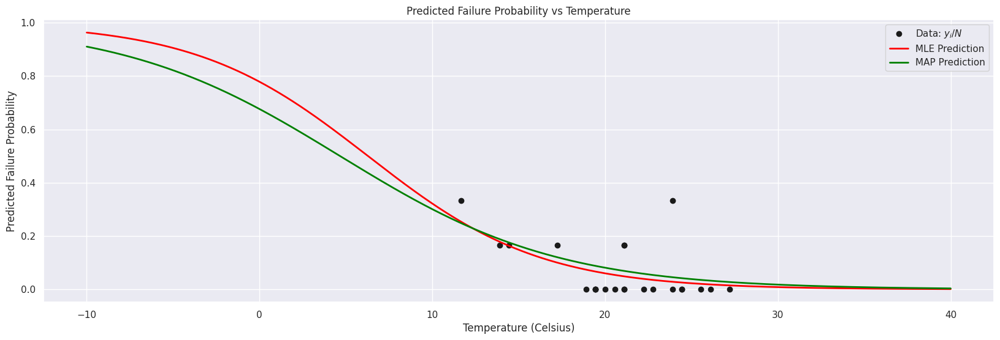

In [16]:
# data for predictions
temp_pred = jnp.linspace(-10, 40, 500)
x_pred = standardize(temp_pred)
N_pred = 6

MLE = log_lik_grid.argmax 
print(MLE)

MAP = log_joint_grid.argmax
print(MAP)

MLE_pred = sigmoid(MLE[0] + MLE[1] * x_pred)
MAP_pred = sigmoid(MAP[0] + MAP[1] * x_pred)


# plot the predictions

fig, ax = plt.subplots(1, 1, figsize=(20, 6))
# Plot the data
plot_data(ax, counts=False)

# Plot MLE predictions
ax.plot(temp_pred, MLE_pred, color='red', label='MLE Prediction', linewidth=2)
# Plot MAP predictions
ax.plot(temp_pred, MAP_pred, color='green', label='MAP Prediction', linewidth=2)
# Add labels and legend
ax.set_xlabel('Temperature (Celsius)')
ax.set_ylabel('Predicted Failure Probability')
ax.set_title('Predicted Failure Probability vs Temperature')
ax.legend()
plt.show()  

# Part 4:  Approximating the posterior using a grid approximation

Rather than using point estimates (such as **MLE** or **MAP**), we now turn to **full Bayesian inference**, which allows us to reason about **uncertainty** in both parameters and predictions.

However, unlike the **Beta-binomial** model, logistic regression does **not** yield a conjugate posterior, meaning that the posterior distribution

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x})
$$

cannot be computed analytically. Instead, we approximate it using a **discrete grid-based representation** over the parameter space, denoted as

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) \approx q(\alpha, \beta).
$$

This grid approximation makes it possible to **summarize and work with the posterior distribution** by evaluating it over a finite set of $(\alpha, \beta)$ values.


To construct the grid approximation $q(\alpha, \beta)$, we need three steps:

1) **Define grid**: First we need to the define grid for $(\alpha, \beta)$. Typically, we choose an appropriate discrete set of values for $\alpha$ and $\beta$ individually, i.e. $\left\lbrace \alpha_i \right\rbrace_{i=1}^I$ and $\left\lbrace \beta_i \right\rbrace_{j=1}^J$, and then take the $(\alpha, \beta)$-grid to be the Cartesian product.
This gives us $I \times J$ evaluation points in total. The Python class `Grid2D` is responsible for generating this grid and evaluating a function (e.g. the log-joint probability) at each grid point.

2) **Evaluation:** Next, we need to evaluate the function $p(\alpha, \beta| \mathbf{y, x})$ on each point in the $(\alpha, \beta)$-grid. Importantly, here we only need to evaluate the posterior **up to a normalization constant**, and hence, **we can evaluate the joint distribution instead of the posterior**. Moreover, for numerical reasons, we often evaluate the **logarithm of the joint distribution**.

Recall **Bayes' rule**:

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) = \frac{p(\mathbf{y} \mid \mathbf{x}, \alpha, \beta) \cdot p(\alpha, \beta)}{p(\mathbf{y} \mid \mathbf{x})}
$$

Since the denominator (evidence) is **constant w.r.t.** $\alpha$ and $\beta$, we only need to evaluate the **unnormalized posterior**, i.e., the joint distribution:

$$
\tilde{\pi}_{ij} := p(\mathbf{y}, \alpha_i, \beta_j \mid \mathbf{x}) = p(\mathbf{y} \mid \mathbf{x}, \alpha_i, \beta_j) \cdot p(\alpha_i, \beta_j)
$$

To improve **numerical stability**, we work in **log-space**:

$$
\log \tilde{\pi}_{ij} = \log p(\mathbf{y} \mid \mathbf{x}, \alpha_i, \beta_j) + \log p(\alpha_i, \beta_j)
$$

This is evaluated using the function provided to `Grid2D`, resulting in a matrix `log_joint_grid`.  
We shift this matrix by subtracting the maximum value before exponentiating to prevent numerical overflow:

```python
self.log_joint_grid = self.log_joint_grid - jnp.max(self.log_joint_grid)
self.tilde_probabilities_grid = jnp.exp(self.log_joint_grid)
```

3) **Normalization**: To ensure that our approximation is a valid distribution, we need to make it sum to $1$. To achieve this, we compute the sum of $p(\mathbf{y}, \alpha, \beta| \mathbf{x})$ across all grid points to approximate the normalization constant $Z$.

That is, 
$$\begin{align*}
q(\alpha_i, \beta_j) = \frac{1}{Z}p(\bm{y}, \alpha_i, \beta_j| \mathbf{x}) = \frac{1}{Z}\tilde{\pi}_{ij} = \pi_{ij}, 
\end{align*}
$$
where we have defined $\log \tilde{\pi}_{ij} = \log p(\bm{y}, \alpha_i, \beta_j| \mathbf{x})$ and $\pi_{ij} = \frac{1}{Z}\tilde{\pi}_{ij}$ for each point on the grid $(\alpha_i, \beta_j)$. The normalization constant then becomes
$$\begin{align*}
Z = \sum_{i,j} p(\mathbf{y}, \alpha_i, \beta_j| \mathbf{ x}) = \sum_{i,j}\tilde{\pi}_{ij} = \sum_{i=1}^I \sum_{j=1}^J \tilde{\pi}_{ij},
\end{align*}
$$
where the sum is over all the points in the grid. Note that $q(\alpha, \beta) = 0$ when evaluated on any point not belonging to the pre-defined $(\alpha, \beta)$-grid.


Then define the **normalized grid**:

$$
\pi_{ij} := q(\alpha_i, \beta_j) = \frac{\tilde{\pi}_{ij}}{Z}
$$

This ensures that the grid approximation **sums to 1**:

$$
\sum_{i,j} \pi_{ij} = 1
$$

In code:

```python
self.Z = jnp.sum(self.tilde_probabilities_grid)
self.probabilities_grid = self.tilde_probabilities_grid / self.Z
```

Finally, we flatten the grid to simplify later operations like sampling and computing expectations.

---

### What Can We Do with the Grid Approximation?

With the grid-based approximation $q(\alpha, \beta) = \pi_{ij}$ in place, we can:

---

1. **Compute posterior expectations:**

$$
\mathbb{E}_q[f(\alpha, \beta)] = \sum_{i,j} f(\alpha_i, \beta_j) \cdot \pi_{ij}
$$

This is implemented in the `compute_expectation` method.

---

2. **Sample from the posterior:**

By interpreting $\pi_{ij}$ as a probability mass function, we can generate samples from the posterior over $(\alpha, \beta)$.  
This allows us to propagate parameter uncertainty to prediction uncertainty.  
See the `sample()` method.

---

3. **Visualize the posterior:**

Posterior modes, spread, and correlations between $\alpha$ and $\beta$ can be visualized easily using `visualize()`.

---

### 🧱 `GridApproximation2D` Class

This class extends `Grid2D` and implements the full grid approximation procedure outlined above.

**The relevant steps are:**

- Compute the log-joint over the grid  
- Exponentiate and normalize to get $\pi_{ij}$  
- Store the flattened values for easy use  
- Provide utility methods for sampling, visualization, expectations  

It also includes sanity checks to verify that the grid sums to one and contains only valid probabilities.

As we will see later, the grid approximation makes it easy for us to

1) compute expectations with respect to the posterior

2) generate samples from the posterior, which will allow us to make inferences about the parameters $\alpha$ and $\beta$ as well as make predictions will taking the uncertainty into account.

The purpose of the class $\texttt{GridApproximation2D}$ given below is to approximate the posterior distribution of the logistic regression model using a grid approximation. We will re-use the code from the $\texttt{Grid2D}$-class to implemented step 1) and step 2) above. Hence, we basically also need to carry out the step 3.

**Task 4.1**: Complete the implementation of the `prep approximation`-function below. Your task is to make sure that the `probability grid`-variable contains all the $\pi_{ij}$ defined above with the proper normalization.

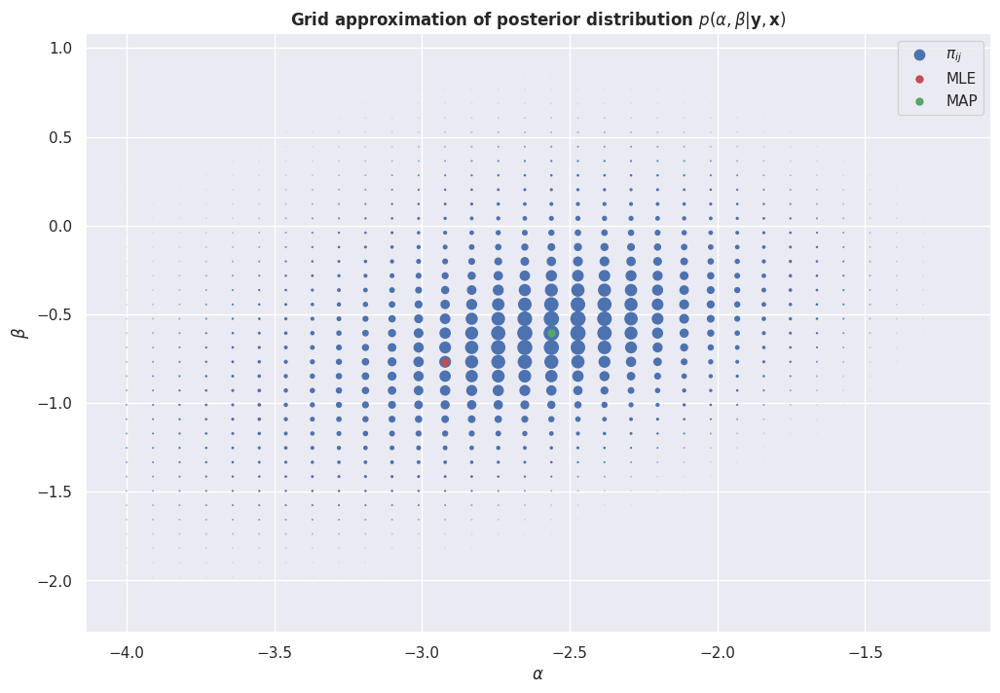

In [42]:
class GridApproximation2D(Grid2D):

    def __init__(self, alphas, betas, log_joint, threshold=1e-8, name="GridApproximation2D"):
        Grid2D.__init__(self, alphas, betas, log_joint, name)
        self.threshold = threshold
        self.prep_approximation()
        self.compute_marginals()
        self.sanity_check()
        
    def prep_approximation(self):
        
        # [num_alpha, num_beta]-sized matrix of the log joint evaluated on the grid 
        self.log_joint_grid = self.values
        self.log_joint_grid = self.log_joint_grid - jnp.max(self.log_joint_grid)

        # evaluate joint for each point on the grid
        self.tilde_probabilities_grid = jnp.exp(self.log_joint_grid) 

        # compute normalization constant
        self.Z = jnp.sum(self.tilde_probabilities_grid)      

        # [num_alpha, num_beta]-matrix of \pi_{ij}-values summing to 1.
        self.probabilities_grid = self.tilde_probabilities_grid/self.Z    

        # flatten for later convinience
        self.alphas_flat = self.alpha_grid.flatten()                                             # shape: [num_alpha*num_beta] = [num_outcomes]
        self.betas_flat = self.beta_grid.flatten()                                               # shape: [num_alpha*num_beta] = [num_outcomes]
        self.num_outcomes = len(self.alphas_flat)                                                # shape: scalar 
        self.probabilities_flat = self.probabilities_grid.flatten()                              # [num_outcomes]

    def compute_marginals(self):
        self.pi_alpha = self.probabilities_grid.sum(1)  
        self.pi_beta = self.probabilities_grid.sum(0)  

        # compute marginal distribution using sum rule
    def compute_expectation(self, f):
        """ computes expectation of f(alpha, beta) wrt. the grid approximation """
        return jnp.sum(f(self.alphas_flat, self.betas_flat)*self.probabilities_flat, axis=0)
    
    def sample(self, key, num_samples=1):
        """ generate num_samples from the grid approximation distribution """
        idx = random.choice(key, jnp.arange(self.num_outcomes), p=self.probabilities_flat, shape=(num_samples, 1))
        return self.alphas_flat[idx], self.betas_flat[idx]

    def visualize(self, ax, scaling=8000, title='Grid approximation'):
        idx = self.probabilities_flat > self.threshold
        ax.scatter(self.alphas_flat[idx], self.betas_flat[idx], scaling*self.probabilities_flat[idx],label='$\\pi_{ij}$')        
        ax.set(xlabel='$\\alpha$', ylabel='$\\beta$')
        ax.set_title(title, fontweight='bold')

    def sanity_check(self):
        assert self.probabilities_grid.shape == self.grid_size, "Probability grid does not have shape [num_alphas, num_betas] (self.grid_size). Check your implementation."
        assert jnp.all(self.probabilities_grid >= 0), "Not all values in probability grid are non-negative. Check your implementation."
        assert jnp.allclose(self.probabilities_grid.sum(), 1), "Values in probability grid do not sum to one. Check your implementation."

# grid
num_alpha, num_beta = 90, 100
alphas = jnp.linspace(-4, 4, num_alpha)
betas = jnp.linspace(-4, 4, num_beta)

# model
model = LR.LogisticRegression(x, y, N, sigma2_alpha=1.0, sigma2_beta=1.0)

# construct grid approximation for posterior
post_approx = GridApproximation2D(alphas, betas, model.log_joint, name='Posterior')

# plot
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
post_approx.visualize(ax, title='Grid approximation of posterior distribution $p(\\alpha, \\beta|  \\mathbf{y}, \\mathbf{x})$')
ax.plot(alpha_MLE, beta_MLE, 'r.', label='MLE', markersize=10);
ax.plot(alpha_MAP, beta_MAP, 'g.', label='MAP', markersize=10);
ax.legend();

📦 **Class: `GridApproximation2D`** *(inherits from `Grid2D`)*

🔍 *What it does:*

This class turns a **log-joint probability function** into a **discrete probability distribution over a 2D grid** of parameters $(\alpha, \beta)$.

---

You can:

- ✅ Normalize the posterior over a grid  
- 🎯 Sample from the posterior  
- 🧮 Compute expectations under the approximate posterior  
- 📊 Visualize the distribution  

---

This is a **grid-based approximation** to Bayesian inference — conceptually:

$$
p(\alpha, \beta \mid \text{data}) \approx \frac{e^{\log p(\alpha, \beta, \text{data})}}{Z}
$$

**🧱 Internals — Line by Line Walkthrough**

```python
class GridApproximation2D(Grid2D):
```
This class **inherits everything from Grid2D**, and adds:
- Proper normalization
- Sampling
- Expectation computation

```python
def __init__(self, alphas, betas, log_joint, threshold=1e-8, name="GridApproximation2D"):
``` 
- alphas, betas: grid values

- log_joint: unnormalized posterior $\log p(\alpha, \beta, y)$ 

- threshold: used to filter very small probabilities for visualization

- Calls Grid2D.__init__() to compute self.values, i.e. the log-joint at each point

Then it calls: 
```python
self.prep_approximation()
self.compute_marginals()
self.sanity_check()
_______
```
**`prep_approximation()`: Core approximation logic**
```python
self.log_joint_grid = self.values
```
`self.values` is inherited from `Grid2D` and stores $\log p(\alpha, \beta, y)$ 

```python
self.log_joint_grid = self.log_joint_grid - jnp.max(self.log_joint_grid)
```
➡️ Numerical stability trick: subtract max before exponentiating, so you don’t overflow
```python
self.tilde_probabilities_grid = jnp.exp(self.log_joint_grid)
```
➡️ Now you have unnormalized probabilities (i.e., $e^{\log p(\alpha, \beta, y)}$)
```python
self.Z = jnp.sum(self.tilde_probabilities_grid)
self.probabilities_grid = self.tilde_probabilities_grid / self.Z
```
➡️ This gives you a normalized posterior over the grid:
$$\pi_{ij} = \frac{p(\alpha_i, \beta_j, y)}{Z} = \frac{e^{\log p(\alpha_i, \beta_j, y)}}{\sum_{ij} e^{\log p(\alpha_i, \beta_j, y)}}$$

```python
# flattening for sampling and expectations
self.alphas_flat = self.alpha_grid.flatten()
self.betas_flat = self.beta_grid.flatten()
self.probabilities_flat = self.probabilities_grid.flatten()
self.num_outcomes = len(self.alphas_flat)
```
These are useful for:

- vectorized expectations

- sampling
_____

`compute_marginals()`

Computes marginals by summing across one axis:

```python
self.pi_alpha = self.probabilities_grid.sum(1)  # over β
self.pi_beta = self.probabilities_grid.sum(0)   # over α
```
So you get

$\pi_\alpha(\alpha) = \sum_{\beta} \pi(\alpha, \beta
)$

and

$\pi_\beta(\beta) = \sum_{\alpha} \pi(\alpha, \beta)$

______________________

```compute_expectation(f)```

Computer: 


$$\mathbb{E}_q[f(\alpha, \beta)] = \sum_{i,j} f(\alpha_i, \beta_j) \cdot \pi_{ij}$$

In code: 

```python
def compute_expectation(self, f):
    return jnp.sum(f(self.alphas_flat, self.betas_flat) * self.probabilities_flat)
```
_____
`sample(key, num_samples)`
Draws samples from $\pi(\alpha, \beta)$ using JAX's `random.choice`:

```python
idx = random.choice(key, jnp.arange(self.num_outcomes), p=self.probabilities_flat, shape=(num_samples, 1))
return self.alphas_flat[idx], self.betas_flat[idx]
```
You can use these samples to:

- simulate predictions
- compute predictive uncertainty
- visualize samples in parameter space
______
`visualize(ax, scaling, title)`
Scatter plot:

- x-axis: α

- y-axis: β

- size of dot = posterior mass $\pi(\alpha, \beta)$

Filters out tiny probabilities (less than threshold).

______

**✅ How to Use It: Full Example**

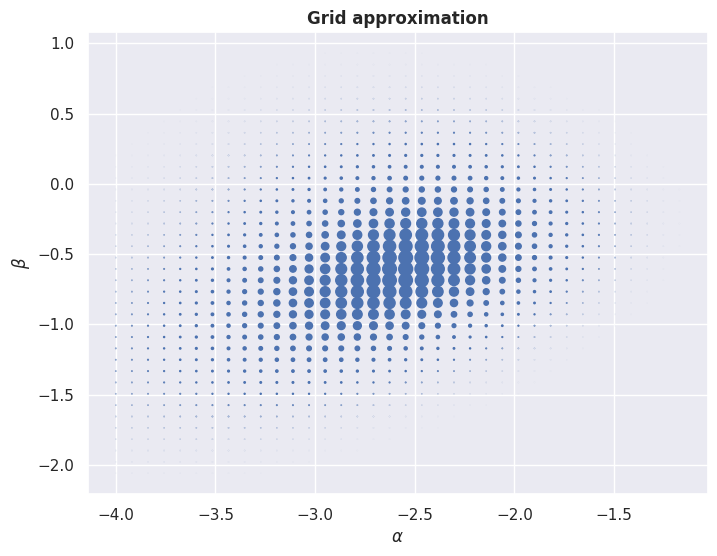

In [27]:
# Step 1: Define grid 

alphas_g2 = jnp.linspace(-4, 4, 100)
betas_g2  = jnp.linspace(-4, 4, 100)

# Step 2: Use log_joint from model 
log_joint_func_g2 = model.log_joint

# Step 3: Create grid approximation 
grid_approx_g2 = GridApproximation2D(alphas=alphas_g2, betas=betas_g2,log_joint=log_joint_func_g2)

# Step 4: Visualize 

fig, ax = plt.subplots(figsize=(8, 6))
grid_approx_g2.visualize(ax)
plt.show()

**🧠 What Can You Do With This?**

*✅ 1. Plot Posterior Samples*

Text(0.5, 1.0, 'Samples from Approximate Posterior')

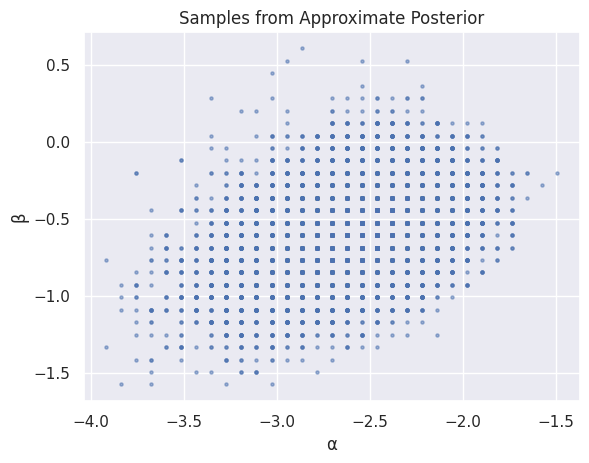

In [37]:
key = random.PRNGKey(0)

alpha_samples_g2, beta_samples_g2 = grid_approx_g2.sample(key, 10000)

plt.scatter(alpha_samples_g2, beta_samples_g2, s=5, alpha=0.5)
plt.xlabel("α")
plt.ylabel("β")
plt.title("Samples from Approximate Posterior")

**✅ 2. Compute Expectations**

In [35]:
# Expected alpha
E_alpha = grid_approx_g2.compute_expectation(lambda a, b: a)
# Expected beta
E_beta = grid_approx_g2.compute_expectation(lambda a, b: b)
# Expected alpha * beta
E_ab = grid_approx_g2.compute_expectation(lambda a, b: a * b)

print(f"E_alpha = {E_alpha}")
print(f"E_beta = {E_beta}")
print(f"E_alpha * E_beta = {E_ab}")


E_alpha = -2.6096439361572266
E_beta = -0.5989373922348022
E_alpha * E_beta = 1.5987387895584106


**✅ 3. Predictive Distribution**

Use samples to get predictive uncertainty at a new point:

Text(0.5, 1.0, 'Posterior Predictive Distribution')

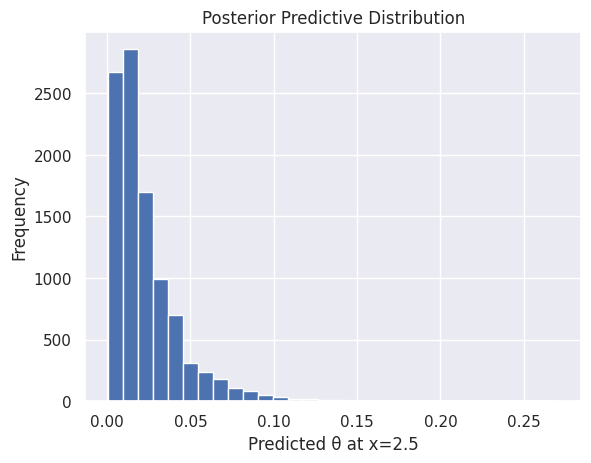

In [38]:
x_new = 2.5
theta_samples = model.theta(x_new, alpha_samples_g2, beta_samples_g2)

plt.hist(theta_samples, bins=30)
plt.xlabel("Predicted θ at x=2.5")
plt.ylabel("Frequency")
plt.title("Posterior Predictive Distribution")


**✅ Summary Table**
| Method                   | Purpose                                               |
| ------------------------ | ----------------------------------------------------- |
| `prep_approximation()`   | Normalizes the unnormalized posterior                 |
| `compute_marginals()`    | Gets marginal distributions over α and β              |
| `compute_expectation(f)` | Computes expectations like E\[α], E\[β], E\[αβ], etc. |
| `sample()`               | Draws samples from posterior                          |
| `visualize()`            | Visualizes the posterior grid                         |
| `sanity_check()`         | Verifies correctness of the posterior                 |

______

If the previous task was implemented correctly, the code about should produce a visualization of the grid approximation. The blue dots show the position of all the grid points, and the radius of the blue dots is controlled by the size of the corresponding weight $\pi_{ij}$. For easier interpretation, we do not plot points where $\pi_{ij}$ is smaller than $10^{-8}$. 


Our first order of business after having obtained the posterior distribution is to produce estimates of the parameters $\alpha$ and $\beta$ as well to quantify the uncertainty, i.e. we will estimate the posterior mean, posterior standard deviation and 95% credibility interval for both $\alpha$ and $\beta$. For this purpose, it is more convenient to work with the marginal posterior distributions of $\alpha$ and $\beta$, which can be readily obtained from the joint posterior approximation $q(\alpha, \beta)$ using the **sum rule**:

$$\begin{align*}
q(\alpha_i) &= \sum_{j} q(\alpha_i, \beta_j) = \sum_{j} \pi_{ij} = \pi^{\alpha}_i\\
q(\beta_j) &= \sum_{i} q(\alpha_i, \beta_j) = \sum_{i} \pi_{ij} = \pi^{\beta}_j,
\end{align*}$$

i.e. $\pi^{\alpha} = q(\alpha_i)$ is the (approximate) marginal posterior probability of $p(\alpha = \alpha_i|\mathbf{y}, \mathbf{x})$.

**Task 4.2**: Go back up the class $\texttt{GridApproximation2D}$ and implemented the $\texttt{compute marginals}$-function. Use it to compute and plot the probability mass functions for the approximate posterior marginal distributions $q(\alpha)$ and $q(\beta)$ as a function of $\alpha$ and $\beta$, respectively.




**Task 4.3**: Compute the posterior mean and standard deviation for $\alpha$ and $\beta$ using the grid approximation by completing the implementation of `DiscreteDistribution1D`-class below. Use the figures from the previous task to verify that your results are (approximately) correct.

*Hints*:
- The mean of a discrete random variable X with PMF $P(X = x)$ is given by $\mathbb{E}\left[X\right] = \sum_{i} x_i P(X = x_i)$, where the sum is over all the possible outcomes of $X$.
- The variance of a discrete random variable X with PMF $P(X = x)$ is given by $\mathbb{V}\left[X\right] = \sum_{i} \left(x_i - \mathbb{E}\left[X\right]\right)^2 P(X = x_i)$, where the sum is over all the possible outcomes of $X$.


In [46]:

class DiscreteDistribution1D(object):

    def __init__(self, outcomes, probabilities, name='DiscreteDistribution'):
        """ represents discrete random variable X in terms of outcomes and probabilities """
        self.outcomes = outcomes
        self.probabilities = probabilities
        assert self.outcomes.shape == self.probabilities.shape
        self.name = name

    def CDF(self, x):
        """ P[X <= x] """
        idx = self.outcomes <= x
        return jnp.sum(self.probabilities[idx]) 
    
    def quantile(self, p):
        """ Q(p) = inf {x | p < CDF(x)} """
        cdf_values = jnp.cumsum(self.probabilities) 
        idx = jnp.where(jnp.logical_or(p < cdf_values, jnp.isclose(p, cdf_values)))[0]
        return jnp.min(self.outcomes[idx])
    
    @property
    def mean(self):
        """ return scalar corresponding to the mean of the discrete distribution """
        return jnp.mean(self.outcomes)
    
    @property
    def variance(self):
        """ return scalar corresponding to the variance of the discrete distribution """
        return jnp.sum((self.outcomes - self.mean)**2 * self.probabilities) 
    
    def central_interval(self, interval_size=95):
        """ return tuple (lower, upper) corresponding to the central interval of the discrete distribution """
        c = 1.-interval_size/100.
        lower = self.quantile(c/2)
        upper = self.quantile(1-c/2)
        return jnp.array([lower, upper])  
    
    def print_summary(self):
        print(f'Summary for {self.name}')
        print(f'\tMean:\t\t\t\t{self.mean:3.2f}')
        print(f'\tStd. dev.:\t\t\t{jnp.sqrt(self.variance):3.2f}')
        print(f'\t95%-credibility interval:\t[{self.central_interval()[0]:3.2f}, {self.central_interval()[1]:3.2f}]\n')


# example use and sanity sanity checks using classic six-sided die
outcomes, probs = jnp.arange(1,6+1), jnp.ones(6)/6
sixsided_die = DiscreteDistribution1D(outcomes, probs)
assert jnp.allclose(sixsided_die.mean, 3.5), f"The mean of a sixsided die should be 3.5, but the value was {sixsided_die.mean:3.2f}. Check your implementation."
assert jnp.allclose(sixsided_die.variance, 35/12), f"The variance of a sixsided die should be approximately 2.92, but the value was {sixsided_die.variance:3.2f}. Check your implementation."
assert jnp.allclose(sixsided_die.central_interval(95), jnp.array([1, 6])), f"The (approximate) 95% central interval of a sixsided die should be (1,6), but the value was {sixsided_die.central_interval(95)}. Check your implementation."

# summarize posterior marginals for alpha and beta
post_alpha_marginal = DiscreteDistribution1D(post_approx.alphas, post_approx.pi_alpha, "posterior distribution of alpha")
post_beta_marginal = DiscreteDistribution1D(post_approx.betas, post_approx.pi_beta, "posterior distribution of beta")

post_alpha_marginal.print_summary()
post_beta_marginal.print_summary()


Summary for posterior distribution of alpha
	Mean:				0.00
	Std. dev.:			2.63
	95%-credibility interval:	[-3.28, -2.02]

Summary for posterior distribution of beta
	Mean:				0.00
	Std. dev.:			0.66
	95%-credibility interval:	[-1.17, -0.04]



Compare the summary statistics to the plots above. Verify that your results are consistent before moving on.




**Task 4.4**: Compute the prior and posterior probability that $\beta < 0$




In [28]:
print(f"Prior probability of p(Beta < 0): {jnp.mean(betas < 0)}")
print(f"Posterior probability of p(Beta < 0): {jnp.mean(post_approx.pi_beta < 0)}")

Prior probability of p(Beta < 0): 0.5
Posterior probability of p(Beta < 0): 0.0


**📦 Class: DiscreteDistribution1D**

*🔍 Purpose:*

Represents a discrete 1D probability distribution such as:

- Posterior marginal of αα or ββ

- Any probability mass function (PMF) over finite outcomes

You can:

- Compute the CDF: P(X≤x)

- Compute quantiles and credible intervals

- Get the mean and variance

- Print a summary (mean, std, and 95% interval)

___________________

**🧱 Method-by-method Breakdown**
```python
__init__(self, outcomes, probabilities, name="...")
```
Initializes the object:

- outcomes: 1D array (e.g., possible values of α or β)

- probabilities: 1D array of same shape, summing to 1

- name: string used in summaries and debugging

```python
assert self.outcomes.shape == self.probabilities.shape
```
Ensures valid distribution.
______

**`CDF(self, x)`**

Return the cumulative distriubution function (CDF) at point x:
$$\text{CDF}(x) = P(X \leq x) = \sum_{i: x_i \leq x} P(X = x_i) = \sum_{i: x_i \leq x} \pi_[i]$$
Used to find probabilities up to a threshold.

```python
idx = self.outcomes <= x
return jnp.sum(self.probabilities[idx])
```
________________________
**`quantile(self, p)`**
Computes: 
$$Q(p) = \inf\{x : P(X \leq x) \geq p\}$$
Equvalent to inverse CDF or pecentile function.

```python
cdf_values = jnp.cumsum(self.probabilities)
idx = jnp.where(jnp.logical_or(p < cdf_values, jnp.isclose(p, cdf_values)))[0]
return jnp.min(self.outcomes[idx])
```

________________________
**`mean (property)`**
Computes 
$$\mathbb{E}[X] = \sum_{i} x_i P(X = x_i)$$
```python
return jnp.mean(self.outcomes)
```
⚠️ This assumes uniform weights. For arbitrary probabilities, you'd use:
```python
return jnp.sum(self.outcomes * self.probabilities)
```
______

`variance (property)`

Computes: 

$$\text{Var}[X] = \sum_i (x_i - \mathbb{X})^2 \cdot p_i$$
```python 
return jnp.sum((self.outcomes - self.mean)**2 * self.probabilities)
```
___________________________
```central_interval(interval_size=95)```

Computes the central credible interval of size `interval_size`%:

```python 
c = 1 - interval_size / 100
lower = self.quantile(c / 2)
upper = self.quantile(1 - c / 2)
return jnp.array([lower, upper])
```
______
```print_summary()```

Nicely formatted terminal output:
```python
print(f'Summary for {self.name}')
print(f'\tMean:\t\t\t\t{self.mean:3.2f}')
print(f'\tStd. dev.:\t\t\t{jnp.sqrt(self.variance):3.2f}')
print(f'\t95%-credibility interval:\t[{self.central_interval()[0]:3.2f}, {self.central_interval()[1]:3.2f}]\n')
```

## 🧠 What the GridApproximation2D Class Is Doing (Mathematically)

This class helps implement:

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) \propto p(\mathbf{y} \mid \alpha, \beta, \mathbf{x}) \cdot p(\alpha, \beta)
$$

This is **Bayes' rule** in the context of **Bayesian logistic regression**:

- **Posterior**:                $p(\alpha, \beta \mid \mathbf{y}, \mathbf{x})$  
- **Likelihood**:               $p(\mathbf{y} \mid \alpha, \beta, \mathbf{x})$  
- **Prior**:                  $p(\alpha, \beta)$

But since logistic regression **does not have a conjugate posterior**, we **cannot compute this posterior exactly**.  
Instead, `GridApproximation2D` discretizes the posterior on a 2D grid of $(\alpha, \beta)$ values and normalizes it into a valid probability distribution.

---

### 💡 How `GridApproximation2D` Implements the Equation

#### 🔹 1. Create the Unnormalized Posterior on a Grid

You provide:

- A grid of values for $\alpha$ and $\beta$ (e.g., using `jnp.linspace`)
- A log-joint function:

$$
\log p(\alpha, \beta, \mathbf{y}) = \log p(\mathbf{y} \mid \alpha, \beta, \mathbf{x}) + \log p(\alpha, \beta)
$$

This is passed to the constructor:

```python
post_approx = GridApproximation2D(alphas, betas, model.log_joint)
```

which internally computes:

```python
self.values = model.log_joint(self.alpha_grid, self.beta_grid)
```

So at each grid point $(\alpha_i, \beta_j)$:

```python
self.values[i, j] = \log p(\mathbf{y} \mid \alpha_i, \beta_j) + \log p(\alpha_i, \beta_j)
```

---

#### 🔹 2. Convert Log-Joint to Normalized Posterior

Inside `prep_approximation()`:

```python
self.tilde_probabilities_grid = jnp.exp(self.log_joint_grid)
self.Z = jnp.sum(self.tilde_probabilities_grid)
self.probabilities_grid = self.tilde_probabilities_grid / self.Z
```

This computes:

$$
\pi_{ij} = \frac{e^{\log p(\mathbf{y} \mid \alpha_i, \beta_j) + \log p(\alpha_i, \beta_j)}}{Z}
$$

Each $\pi_{ij}$ is your **posterior mass** at $(\alpha_i, \beta_j)$.

---

### ✅ How to Interpret the Posterior Plot

```python
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
post_approx.visualize(ax, title='Grid approximation of posterior distribution')
```

This shows:

- **Each dot** = a pair $(\alpha, \beta)$ on the grid  
- **Dot size** = posterior mass $\pi_{ij}$  
- You’ll see a “cloud” around high-density regions

---

### ✅ Understanding the MLE and MAP Overlay

```python
ax.plot(alpha_MLE, beta_MLE, 'r.', label='MLE')
ax.plot(alpha_MAP, beta_MAP, 'g.', label='MAP')
```

- `alpha_MLE`, `beta_MLE`: obtained from `log_lik_grid.argmax`
- `alpha_MAP`, `beta_MAP`: obtained from `post_approx.argmax`

Since `GridApproximation2D` inherits from `Grid2D`, it exposes `.argmax` to get MAP.

---

### ✅ Summary — Putting It All Together

| **Concept**              | **Math**                                                                 | **Code**                        |
|--------------------------|--------------------------------------------------------------------------|----------------------------------|
| Grid of parameters       | $(\alpha_i, \beta_j)$                                                     | `jnp.meshgrid(alphas, betas)`   |
| Unnormalized posterior   | $p(\mathbf{y} \mid \alpha, \beta) \cdot p(\alpha, \beta)$                | `self.log_joint_grid`           |
| Normalized posterior     | $\pi_{ij} = \frac{e^{\log(\cdot)}}{Z}$                                   | `self.probabilities_grid`       |
| Posterior plot           | Point size = $\pi_{ij}$                                                   | `visualize()`                   |
| MAP                      | $\arg\max \log p(\alpha, \beta, \mathbf{y})$                             | `post_approx.argmax`            |
| MLE                      | $\arg\max \log p(\mathbf{y} \mid \alpha, \beta)$                         | `log_lik_grid.argmax`           |
____

## 🎯 What Are Posterior Marginals?

Let’s start from the **joint posterior**:

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x})
$$

This is a **2D distribution** over both $\alpha$ and $\beta$, computed via Bayes’ rule:

$$
p(\alpha, \beta \mid \mathbf{y}, \mathbf{x}) \propto p(\mathbf{y} \mid \alpha, \beta) \cdot p(\alpha, \beta)
$$

---

### 🔸 Posterior Marginal of $\alpha$

This is the distribution of $\alpha$ **alone**, obtained by **summing out** all possible values of $\beta$:

$$
p(\alpha \mid \mathbf{y}, \mathbf{x}) = \sum_\beta p(\alpha, \beta \mid \mathbf{y}, \mathbf{x})
$$

This process is called **marginalization**:

> “What is the probability of each value of $\alpha$, regardless of what $\beta$ is?”

---

### 🔸 Posterior Marginal of $\beta$

Likewise:

$$
p(\beta \mid \mathbf{y}, \mathbf{x}) = \sum_\alpha p(\alpha, \beta \mid \mathbf{y}, \mathbf{x})
$$

---

## 🧠 Why Do We Care?

Marginal distributions let us:

- Understand **uncertainty in each parameter separately**  
- Compute **credible intervals** (e.g., “$\alpha$ is likely between -2.5 and -0.5”)  
- Summarize the posterior with **mean and standard deviation**  
- Make **marginal decisions** (e.g., fix one parameter, reason about the other)

---

## ✅ In Your Code: Where This Happens

Inside `GridApproximation2D`, marginals are computed as:

```python
def compute_marginals(self):
    self.pi_alpha = self.probabilities_grid.sum(1)  # Sum over beta (columns)
    self.pi_beta  = self.probabilities_grid.sum(0)  # Sum over alpha (rows)
```

- `self.probabilities_grid`: 2D posterior over $(\alpha, \beta)$  
- `self.pi_alpha`: marginal over $\alpha$  
- `self.pi_beta`: marginal over $\beta$  

---

## 📊 How to Use Posterior Marginals

Use the `DiscreteDistribution1D` class:

```python
post_alpha_marginal = DiscreteDistribution1D(
    outcomes=post_approx.alphas,
    probabilities=post_approx.pi_alpha,
    name="Posterior of alpha"
)

post_beta_marginal = DiscreteDistribution1D(
    outcomes=post_approx.betas,
    probabilities=post_approx.pi_beta,
    name="Posterior of beta"
)

post_alpha_marginal.print_summary()
post_beta_marginal.print_summary()
```

This will give you:

- Posterior **mean**  
- Posterior **standard deviation**  
- **95% credible intervals**

---

## 📐 Visual Summary

```
    Joint Posterior:  p(α, β | data)

        ┌───────────────┐
        │               │      →  Marginal over β (sum rows)
        │               │
        │               │
        │               │      ↓  Marginal over α (sum columns)
        └───────────────┘
```

---

## 🧪 In Words

- **Marginal of $\alpha$** answers:  
  _“What do I believe about $\alpha$, regardless of $\beta$?”_

- **Marginal of $\beta$** answers:  
  _“What do I believe about $\beta$, regardless of $\alpha$?”_


# Part 5:  Propagating uncertainty from parameters to predictions

Using the grid approximation, we got a handle on the posterior distribution of $\alpha$ and $\beta$ given the observed data, i.e. $p(\alpha, \beta|\mathbf{x}, \mathbf{y})$. We will now turn our attention to making predictions. For example, we want to predict the following quantities for a given temperature $t^* \in \mathbb{R}$, (standardized to $x^*$):

- The probability of failure for each o-ring
- The probability of at least one o-ring failing
- The expected number of failing o-rings
- A 95\%-credibility interval for then number of failed o-rings

**Assuming we know** the value of $\alpha$ and $\beta$, all quantities above are easily computed from the predictive likelihood

$$\begin{align}
p(y^*|x^*, \alpha, \beta) = \text{Bin}(y^*|N^*, \alpha, \beta), \quad \text{where } \theta^* = \sigma(\alpha + \beta x^*).
\end{align}
$$

This give us the full distribution of possible failure counts $y^*$ for the given $x^*$.


However, in practice we do not now the value of $\alpha$ and $\beta$, and therefore, we need to estimate them. The simplest approach for making predictions is to use a **plugin approximation** like we did in part 3. That is, we simply plug in one of our point estimates for $\alpha$ and $\beta$ into the equation above, e.g. the MLE or MAP estimator. This is usually fast and easy to do, but the significant drawback is that it tends to produce **overconfident** predictions because it ignores the uncertainty for $\theta^*$. Instead, we can propagate the uncertainty from the posterior distribution $q(\alpha, \beta)$ to the predictive distribution using **marginalization** via the sum:

$\begin{align}
p(y^*|\mathbf{y}, \mathbf{x}, x^*) = \int \int p(y^*|x^*, \alpha, \beta) p(\alpha, \beta|\mathbf{y}, \mathbf{x}) \text{d}\alpha \text{d}\beta = \mathbb{E}_{p(\alpha, \beta|\mathbf{y}, \mathbf{x})}\left[p(y^*|x^*, \alpha, \beta)\right] \approx \mathbb{E}_{q(\alpha, \beta)}\left[p(y^*|x^*, \alpha, \beta)\right].
\end{align}$

That is, when we make predictions, we average over the posterior distribution. **Instead of picking a single set of parameters, we consider all possible values for $\alpha$ and $\beta$ and weigh them according to their posterior probability**. This may be abstract, but the grid approximation can help understand this more intuitively:

$\begin{align}
p(y^*|\mathbf{y}, \mathbf{x}, x^*) = \mathbb{E}_{p(\alpha, \beta|\mathbf{y})}\left[p(y^*|x^*, \alpha, \beta)\right]\approx \mathbb{E}_{q(\alpha, \beta)}\left[p(y^*|x^*, \alpha, \beta)\right] = \sum_{ij} p(y^*|x^*, \alpha_i, \beta_j) \pi_{ij},
\end{align}
$

where we literally evaluate $p(y^*|x^*, \alpha, \beta)$ for each possible set of parameters $(\alpha_i, \beta_j)$ and weigh them by the posterior probability $\pi_{ij} = q(\alpha_i, \beta_j)$. We refer to the distribution $p(y^*|\mathbf{y}, \mathbf{x}, x^*)$ as the **posterior predictive distribution**. Recall, we can also cast the plugin approximations as approximation over the posterior predictive distribution, where the posterior is approximated by a posterior distribution that as all the mass on the single point $(\hat{\alpha}_{MLE}, \hat{\beta}_{\text{MLE}})$. 

The integral in **(2)** may not be analytically tractable, but with the grid approximation, we can compute this expectation numerically, as given in the sum above in equation **(2)**. Where:

$(\alpha_i, \beta_j)$ is a point on the grid,

$\pi_{ij} \approx p(\alpha_i, \beta_j \mid \mathbf{x}, \mathbf{y})$ is the approximate posterior probability at that grid point.

Thus, we evaluate the likelihood at each grid point and average the predictions, weighted by the posterior probabilities.


> **Summary of Key Idea**    Instead of selecting a single “best guess” for the parameters, we average over all plausible parameter values, weighted by how probable they are under the posterior. This produces predictions that are more calibrated and less overconfident. In this way, the posterior predictive distribution $p(y^* \mid \mathbf{x}, \mathbf{y}, x^*)$ reflects both the inherent uncertainty in future outcomes and the epistemic uncertainty about the parameters themselves.


The code below uses the plugin approximation for the MLE/MAP estimator to compute and plot the posterior predictive distribution $p(y^*=k|\mathbf{y}, \mathbf{x}, x^*)$ for $k \in \left\lbrace 0, 1, \dots 6\right\rbrace$. The code also reports the mean and a 95\% interval for each methods for each temperatures (assuming the tasks above have been solved). 

**Task 5.1**: Compute and plot and the full posterior predictive distribution $p(y^*=k|\mathbf{y}, \mathbf{x}, x^*)$ with $k \in \left\lbrace 0, 1, \dots 6\right\rbrace$ for $t = 25^{\circ}C$ and $t = 0^{\circ}C$. 



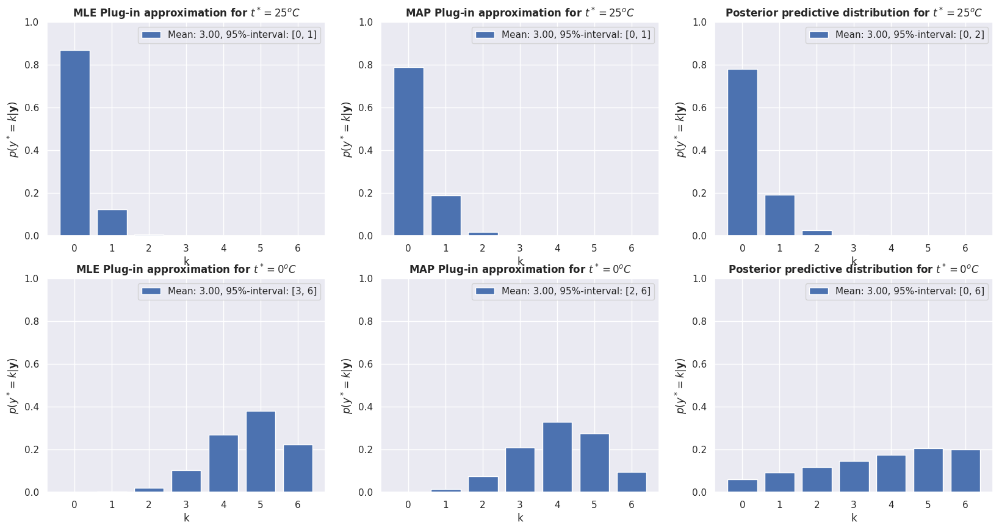

In [47]:
# target temperatures t^*
temp_stars = [25, 0]

# outcome space for y^*
ks = jnp.arange(0, 6+1)

# predictive likelihood p(y^*=k|x^*, alpha, beta)
pred_lik = lambda k, x_star, alpha, beta: binom_dist.pmf(k=k, n=6, p=model.theta(x_star, alpha, beta))

# prep figure
fig, ax = plt.subplots(2, 3, figsize=(20, 10))

mean_and_interval_label = lambda dist: f'Mean: {dist.mean:3.2f}, 95%-interval: [{dist.central_interval()[0]:d}, {dist.central_interval()[1]:d}]'

for n, t_star in enumerate(temp_stars):

    # standardize to get x^*
    x_star = standardize(t_star)

    # compute plugin approximations using MLE and MAP. Shape must be [7] (matching the shape of ks)
    pred_lik_probs_MLE = pred_lik(ks, x_star, alpha_MLE, beta_MLE)
    pred_lik_probs_MAP = pred_lik(ks, x_star, alpha_MAP, beta_MAP)
    
    # compute posterior predictive distribution as a weighted averaged over all parameter vales. Shape must be [7] (matching the shape of ks)
    pred_lik_bayes_probs = jnp.sum(pred_lik(ks, x_star, post_approx.alphas_flat[:, None], post_approx.betas_flat[:, None])*post_approx.probabilities_flat[:, None], axis=0) 

    # prepare for plotting etc
    pred_dist_MLE = DiscreteDistribution1D(ks, pred_lik_probs_MLE, name='MLE Plug-in approximation')
    pred_dist_MAP = DiscreteDistribution1D(ks, pred_lik_probs_MAP, name='MAP Plug-in approximation')
    pred_dist_bayes = DiscreteDistribution1D(ks, pred_lik_bayes_probs, name="Posterior predictive distribution")

    # plot
    for i, dist in enumerate([pred_dist_MLE, pred_dist_MAP, pred_dist_bayes]):
        ax[n, i].bar(ks, dist.probabilities, label=mean_and_interval_label(dist))
        ax[n, i].set(xlabel='k', ylabel='$p(y^* = k|\\mathbf{y})$', ylim =(0, 1))
        ax[n, i].set_ylim((0, 1))
        ax[n, i].set_title(f'{dist.name} for $t^* = {t_star}^oC$', fontweight='bold')
        ax[n, i].set(xlabel='k', ylabel='$p(y^* = k|\\mathbf{y})$', ylim =(0, 1))
        ax[n, i].legend()


****Task 5.2**: Comment on the differences between the results obtained using plugin approximations, i.e. the MLE/MAP estimators, and the posterior predictive distributions. How does the three approximations compare? In regions with data? In regions without data?

**Note**: *This is a discussion question, which means that you actively have to experiment with the code and/or reason with the equations to arrive at the relevant conclusions. This also means that we won't provide a specific solution for this task. However, you are more than welcome to check your understanding and your conclusions with the TAs.***



In the very last of the exercise, we will visualize the posterior for $f(x)$ and $\theta(x)$ to build over intuition. We will start by drawing a set of random samples of $(\alpha, \beta)$ from the posterior approximation and then compute and visualize $f(x)$ and $\theta(x)$ for each sample. We will repeat this process for the prior distribution $p(\alpha, \beta)$.

**Task 5.3**: The code below generates $\texttt{num samples}$ of $\alpha, \beta$ from both the prior and posterior and plots them. Compute $f(x_{\text{pred}})$ and $\theta(x_{\text{pred}})$ for each of these samples and store them in the variables $\texttt{f samples}$ and $\texttt{theta samples}$ pre-defined below. 

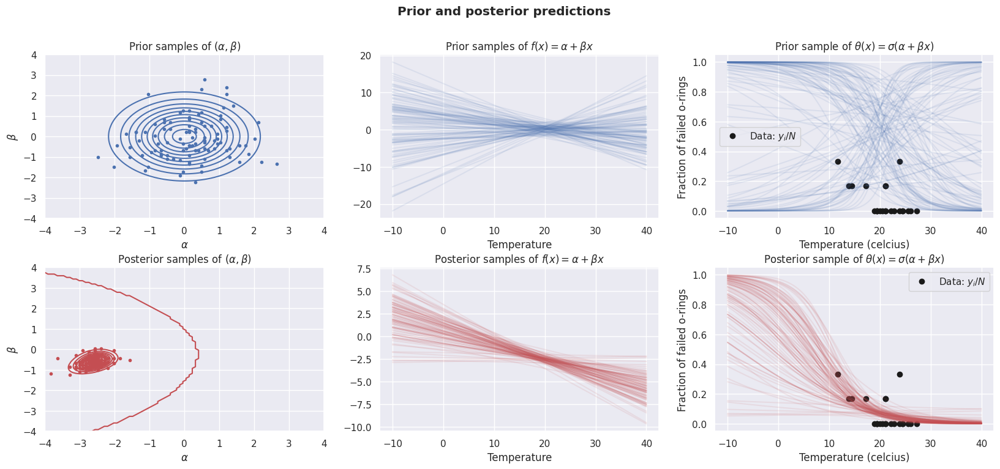

In [49]:
# data for predictions
temp_pred = jnp.linspace(-10, 40, 500)
x_pred = standardize(temp_pred)
N_pred = 6

# number of samples plot
num_samples = 100

# grid
num_alpha, num_beta = 90, 100
alphas = jnp.linspace(-4, 4, num_alpha)
betas = jnp.linspace(-4, 4, num_beta)

# set up prior and posterior for visualization purposes
model = LR.LogisticRegression(x, y, N, sigma2_alpha=1., sigma2_beta=1.)
post_approx = GridApproximation2D(alphas, betas, model.log_joint, name='Posterior')
prior_approx = GridApproximation2D(alphas, betas, model.log_prior, name='Prior')

# specify seed
seed = 123
key = random.PRNGKey(seed)


# plot for each distribution...
fig, ax = plt.subplots(2, 3, figsize=(20, 8))
for idx_plot, dist in enumerate([prior_approx, post_approx]):
    key, subkey = random.split(key)

    # plot data and contours of distribution
    plot_data(ax[idx_plot, 2], counts=False)
    dist.plot_contours(ax[idx_plot, 0], f=jnp.exp, color=colors[idx_plot])

    # get (alpha, beta)-samples to visualize
    alpha_samples, beta_samples = dist.sample(subkey, num_samples)

    # compute samples of f(x_pred) and theta(x_pred). Shape must be [num_samples, len(temp_pred)] for both f_samples and theta_samples
    f_samples = model.f(x_pred, alpha_samples, beta_samples) 
    theta_samples = model.theta(x_pred, alpha_samples, beta_samples) 

    # plot
    ax[idx_plot, 0].plot(alpha_samples, beta_samples, '.', color=colors[idx_plot])

    # plot each sample of f and theta
    ax[idx_plot, 1].plot(temp_pred, f_samples.T, '', color=colors[idx_plot], alpha=0.1)
    ax[idx_plot, 2].plot(temp_pred, theta_samples.T, '', color=colors[idx_plot], alpha=0.1)
    ax[idx_plot, 2].legend()

    # title and labels
    ax[idx_plot, 0].set(title=f'{dist.name} samples of $(\\alpha, \\beta)$')
    ax[idx_plot, 1].set(title=f'{dist.name} samples of $f(x) = \\alpha + \\beta x$', xlabel='Temperature')
    ax[idx_plot, 2].set(title=f'{dist.name} sample of $\\theta(x) = \\sigma(\\alpha + \\beta x)$')

fig.suptitle('Prior and posterior predictions', fontweight='bold')
fig.subplots_adjust(hspace=0.3)


**Task 5.4**: Study the code and plots above and make sure you can explain the following:

- What is plotted in each of the six panels? 
- What is the relationship between each of the dots in the left columns and the curves in the center and right columns?
- How the uncertainty on $f(x)$ and $\theta(x)$ is controlled by the distribution of $(\alpha, \beta)$?
- How well does each of the prior samples match the observed data?
- How well does each of the posterior samples match the observed data?

**Note**: *This is a discussion question, which means that you actively have to experiment with the code and/or reason with the equations to arrive at the relevant conclusions. This also means that we won't provide a specific solution for this task. However, you are more than welcome to check your understanding and your conclusions with the TAs.*

We can also use posterior samples to the summarize the pointwise posterior mean and 95\% intervals of $f(x)$ and $\theta(x)$ :

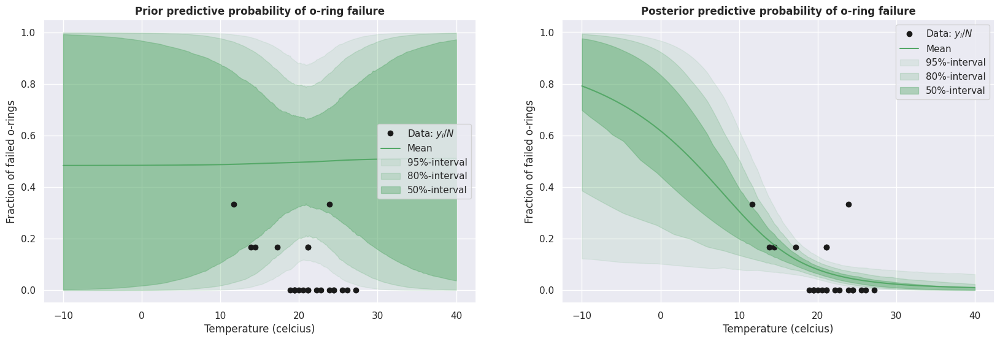

In [52]:
# set seed
seed = 0
key = random.PRNGKey(seed)

# set up prior and posterior for visualization purposes
model = LR.LogisticRegression(x, y, N, sigma2_alpha=1., sigma2_beta=1.)
post_approx = GridApproximation2D(alphas, betas, model.log_joint, name='Posterior')
prior_approx = GridApproximation2D(alphas, betas, model.log_prior, name='Prior')

# plot
fig, ax = plt.subplots(1, 2, figsize=(20, 6))
plot_data(ax[0], counts=False)
plot_data(ax[1], counts=False)

num_samples = 2000

for idx_plot, dist in enumerate([prior_approx, post_approx]):
    key, subkey = random.split(key)

    alpha_samples, beta_samples = dist.sample(subkey, num_samples)

    theta_samples = model.theta(x_pred, alpha_samples, beta_samples)
    theta_mean = theta_samples.mean(0)
    theta_lower = jnp.quantile(theta_samples, 0.025, axis=0)
    theta_upper = jnp.quantile(theta_samples, 1-0.025,)

    ax[idx_plot].plot(temp_pred, theta_mean, 'g-', label='Mean')
    for interval_size, b in [(0.95, 0.1), (0.8, 0.2), (0.5, 0.4)]:
        c = 1-interval_size
        theta_lower = jnp.quantile(theta_samples, c/2, axis=0)
        theta_upper = jnp.quantile(theta_samples, 1-c/2, axis=0)
        ax[idx_plot].fill_between(temp_pred, theta_lower, theta_upper, color='g', alpha=b, label=f'{interval_size*100:2.0f}%-interval')
    ax[idx_plot].legend()
    ax[idx_plot].set_title(f'{dist.name} predictive probability of o-ring failure', fontweight='bold')

**Task 5.5**: Compute and plot the posterior mean and a 95% credibility interval for the probability of obtaining at least one failure among the 6 o-rings



Text(0.5, 1.0, 'Posterior predictive probability of at least one o-ring failure')

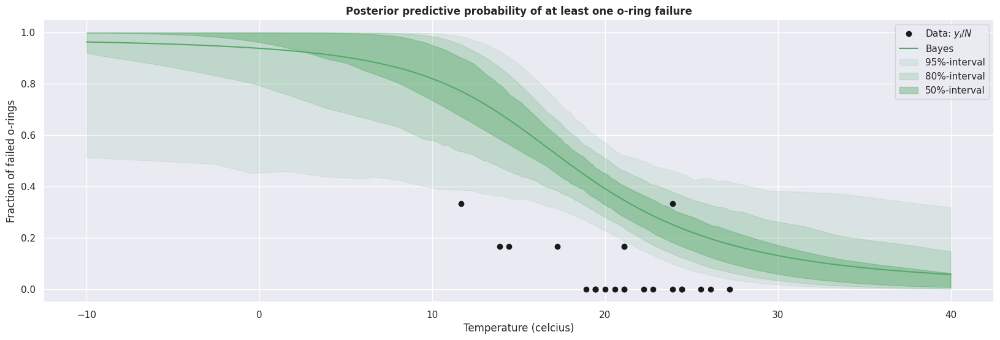

In [54]:
# set seed and number of samples
seed = 0
key = random.PRNGKey(seed)
num_samples = 2000


# set up prior and posterior for visualization purposes
model = LR.LogisticRegression(x, y, N, sigma2_alpha=1., sigma2_beta=1.)
post_approx = GridApproximation2D(alphas, betas, model.log_joint, name='Posterior')

alpha_samples, beta_samples = post_approx.sample(key, num_samples)
theta_samples = model.theta(x_pred, alpha_samples, beta_samples)

# probability of at least one failure wrt. a binomial post_approxrinution
prob_at_least_one_failure = 1 - (1-theta_samples)**N_pred

# compute mean and interval
post_mean = prob_at_least_one_failure.mean(0)
post_lower = jnp.quantile(prob_at_least_one_failure, 0.025, axis=0)
post_upper = jnp.quantile(prob_at_least_one_failure, 1-0.025,)

# plot
fig, ax = plt.subplots(1, 1, figsize=(20, 6))
plot_data(ax, counts=False)

ax.plot(temp_pred, post_mean, 'g-', label='Bayes')
for interval_size, b in [(0.95, 0.1), (0.8, 0.2), (0.5, 0.4)]:
    c = 1-interval_size
    post_lower = jnp.quantile(prob_at_least_one_failure, c/2, axis=0)
    post_upper = jnp.quantile(prob_at_least_one_failure, 1-c/2, axis=0)
    ax.fill_between(temp_pred, post_lower, post_upper, color='g', alpha=b, label=f'{interval_size*100:2.0f}%-interval')
ax.legend()
ax.set_title(f'{post_approx.name} predictive probability of at least one o-ring failure', fontweight='bold')